# Source Code untuk Proses Pengolahan Data Karakteristik Mahasiswa

Tim Pengembang:
*   M. Taqiyyuddin F.
*   Dr. Ariana Yunita
*   M. Zaki Almuzakki, M.Si., M.Sc

Program ini dibuat untuk mengelompokkan karakteristik mahasiswa di beberapa mata kuliah yang diajarkan di universitas pertamina. data yang digunakan diperoleh dari form kuisioner terhadap 3 (tiga) kelas mata kuliah, dengan detail data yang diperoleh

Program Studi Ilmu Komputer<br>
Universitas Pertamina<br>
September 2023<br>

# Library and Tools


## Library Installation

Jalankan program ini untuk menginstall beberapa library tambahan yang diperlukan untuk keseluruhan program ini

In [1]:
# !pip install pandas
# !pip install numpy
# !pip install matplotlib
# !pip install seaborn
# !pip install sklearn
# !pip install prince
# !pip install tqdm

## Import Library

In [1]:
### Liblary untuk mengolah dataset
import pandas as pd
### Library untuk melakukan perhitungan aritmatika
import numpy as np

### library matplotlib dan seaborn digunakan untuk membuat visualisasi data
import matplotlib.pyplot as plt
import seaborn as sns

### Library untuk melakukan data scaling baik itu normalisasi (MinMaxScaler), Standardisasi (Standardisasi)
from sklearn.preprocessing import MinMaxScaler, StandardScaler
### Library untuk melakukan data scaling parametrik monotonik. dokumentasi dari library ini dapot dilihat pada link berikut:
### https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.PowerTransformer.html
from sklearn.preprocessing import PowerTransformer

### Library untuk melakukan ordinal encoding (OrdinalEncoder) maupun One Hot Encoding (OneHotEncoder)
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder
### Library untuk melakukan One Hot Encoding pada kolom dengan setiap baris data memiliki nilai unik lebih dari satu
### (Multi Valued Column)
from sklearn.preprocessing import MultiLabelBinarizer

### Library untuk melakukan Dimensional Reduction dengan metode yang digunakan yaitu:
### Principal Component Analysis (PCA). Truncated Singular Value Decomposition (TruncatedSVD)
from sklearn.decomposition import PCA, TruncatedSVD
### Selain itu, juga bereksperimen dengan metode lain seperti t-SNE (TSNE)
from sklearn.manifold import TSNE
### dan Factor Analysis of Mixed Data.
### Dokumentasi dari library FAMD: https://maxhalford.github.io/prince/famd/ OR https://github.com/MaxHalford/prince/blob/master/prince/famd.py
### Artikel mengenai FAMD: https://towardsdatascience.com/factor-analysis-of-mixed-data-5ad5ce98663c
from prince import FAMD

### Library yang digunakan untuk melakukan operasi regex kepada data teks / string
import re
### Library yang digunakan untuk melakukan konfigurasi pada sistem operasi
import os
### Library yang digunakan untuk menyimpan maupun memuat file yang berisi model atau tool yang digunakan pada pengolahan data
### maupun pembuatan model
import pickle
### Library yang digunakan untuk mengetahui lama waktu proses looping program dalam bentuk progress bar
from tqdm.auto import tqdm

In [2]:
### Jalankan blok program ini untuk membuat direktori atau folder yang akan digunakan pada keseluruhan program

### untuk membuat folder 'visualization' yang menyimpan data gambar dari visualisasi data
# os.mkdir(os.path.join(os.path.abspath('./'), 'visualization'))

### untuk membuat folder 'data' yang menyimpan dataset yang digunakan pada pengolahan data ini
# os.mkdir(os.path.join(os.path.abspath('./'), 'data'))

### untuk membuat folder 'data' yang menyimpan penggunaan tools pada saat pengolahan data ini, kedalam bentuk file
### yang dapat dibuka kembali pada file program lain yang memerlukan 
### (seperti penerapan Data Scaling yang telah sesuai dengan karakteristik data yang dimiliki)
# os.mkdir(os.path.join(os.path.abspath('./'), 'tools'))

## Utils

In [3]:
# fungsi untuk menyimpan gambar visualisasi data
def savefig(filename):
    """
    fungsi untuk meyinpan data gambar dari visualisasi data yang dibentuk
    
    input: 
        - filename: nama dari visualisasi yang dibentuk (string)
        
    output:
        sebuah file data pada folder 'visualization' berformat PNG
    """
    plt.savefig(f'./visualization/{filename}.png', bbox_inches='tight')
    
def addBarLabels(xs, ys, texts=None, ax=None):
    """
    fungsi untuk menambahkan keterangan jumlah data untuk setiap bar pada visualisasi barplot
    
    input: 
        - xs: sekumpulan posisi horizontal di sumbu x dari setiap bar data (list)
        - ys: sekumpulan posisi vertikal di sumbu y dari setiap bar data (list)
        - texts: seklumpulan data berupa angka yang ditampilkan pada setiap bar (list) (opsional)
        - ax: parameter yang digunakan apabila visualisasi diterapkan pada suatu objek axes (matplotlib axes object) (opsional)
        
    output:
        keterangan jumlah pada visualisasi barplot berbentuk angka pada masing-masing bar atau batang
    """
    if texts is None:
        texts = ys

    if ax is None:
        for x, y, text in zip(xs, ys, texts):
            plt.text(x, y, text, ha = 'center')
    else:
        for x, y, text in zip(xs, ys, texts):
            ax.text(x, y, text, ha = 'center')
            
def show_columns_unique_value(data):
    """
    fungsi untuk menampilkan data nilai unik dari setiap kolom pada dataset
    
    input: 
        - data: data yang ingin ditampilan nilai unik dari setiap kolom.
                dapat berupa keseluruhan data set, maupun nama kolom dari masing-masing dataset
                (DataFrame OR Columns Name List)
        
    output:
        menampilkan output berupa keterangan nilai unik dari setiap kolom
    """
    if type(data) == pd.core.frame.DataFrame:
        for (column, value) in data.items():
            print(f'Column Name: {column} | Unique Total: {value.nunique()} | Data types: {value.dtype}')
            print(f'Unique Value: {value.unique()}')    
            print('='*100)
            print()
    else:
        for column in data:
            print(f'Column Name: {column} | Unique Total: {df_cleaned[column].nunique()} | Data types: {df_cleaned[column].dtype}')
            print(f'Unique Value: {df_cleaned[column].unique()}')    
            print('='*100)
            print

# Memuat Data Form Original

## Open CSV File

In [4]:
### running sesuaikan dengan peletakan file didalam folder bernama data
### dengan nama dari dataset pengumpulan form kuisioner data karakteristik mahasiswa
filename_form = './data/Karakteristik Pembelajar Universitas Pertamina (Jawaban) - Form Responses 1.csv'

In [5]:
df_original = pd.read_csv(filename_form)

In [22]:
df_original.columns

Index(['Timestamp', 'Nama', 'NIM', 'Jenis Kelamin', 'Tahun Lahir',
       'Tempat Tinggal Saat Ini', 'Provinsi Asal Saat SMA',
       'Kota Asal Saat SMA', 'IPK Saat Ini', 'IPS Semester Genap 2021/2022',
       'IPS Semester Ganjil 2022/2023', 'Nilai Mata Kuliah Matematika Bisnis',
       'Nilai Mata Kuliah Bahasa Inggris I', 'Jumlah SKS Semester Ini',
       'Jumlah Mata Kuliah Mengulang',
       'Apakah di Semester Ini Anda Memiliki Beasiswa ?',
       'Jalur Pendaftaran Kampus', 'Jenis Sekolah / Pendidikan Sebelum Kuliah',
       'Jenis Sekolah SMA', 'Nilai Total UTBK', 'Nilai Total UN',
       'Nilai Matematika SMA/Sederajat Kelas 12', 'Pendidikan Terakhir Ibu',
       'Pendidikan Terakhir Ayah', 'Jumlah Saudara Kandung',
       'Siapakah Role Model / Panutan Anda di Keluarga ?',
       'Penghasilan Orang Tua', 'Jenis Tempat Tinggal Keluarga',
       'Pendapat Anda Mengenai Persepsi atau Kesan Terhadap Mata Kuliah Sistem Informasi Manajemen',
       'Apakah Anda Meluangkan Waktu Kh

In [104]:
temp = df_original.copy()[[
    'Nama', 'Nama Kelas yang Diikuti',
    'Cantumkan nomor telepon anda untuk kesempatan mendapatkan pulsa sebesar Rp. 25.000'
]]

temp = temp.rename(columns={
    'Nama':'nama', 'Nama Kelas yang Diikuti':'kelas',
    'Cantumkan nomor telepon anda untuk kesempatan mendapatkan pulsa sebesar Rp. 25.000':'nomor telepon'
})
temp['kelas'] = temp['kelas'].fillna('Sistem Informasi Manajemen')
temp['nomor telepon'] = temp['nomor telepon'].astype('string')


temp
# temp.to_excel('data kuota kuisioner.xlsx')


,nama,kelas,nomor telepon
0,Louis pratama,Sistem Informasi Manajemen,081282094244
1,Mohammad Ammar Firdaus,Sistem Informasi Manajemen,087724122483
2,Dika Pramuidita,Sistem Informasi Manajemen,+6287873564467
3,Haryo Shandy Busiry,Sistem Informasi Manajemen,085210230865
4,Wira Yudha Gunawan,Sistem Informasi Manajemen,082260256378
...,...,...,...
136,Aryanda Rizky Pratama,Praktikum Pembelajaran Mesin Prodi Ilmu Komputer,<NA>
137,M Labib Rafsanjani A,Praktikum Pembelajaran Mesin Prodi Ilmu Komputer,081212340602
138,Farhan Alwahid,Praktikum Pembelajaran Mesin Prodi Ilmu Komputer,0895359710593
139,Putri Salsabila Al Abrar,Praktikum Pembelajaran Mesin Prodi Ilmu Komputer,082173254419


In [109]:
temp1 = temp.loc[temp['kelas'] == 'Praktikum Pembelajaran Mesin Prodi Ilmu Komputer']
temp1 = temp1.dropna(subset='nomor telepon').sample(n=10)


temp2 = temp.loc[temp['kelas'] == 'Sains Data dan Pembelajaran Mesin dalam Geofisika']
temp2 = temp2.dropna(subset='nomor telepon').sample(n=10)


temp3 = temp.loc[temp['kelas'] == 'Sistem Informasi Manajemen']
temp3 = temp3.dropna(subset='nomor telepon').sample(n=10)

In [110]:
temp2

,nama,kelas,nomor telepon
72,Patrick Fitzgerald Joel Kalesaran,Sains Data dan Pembelajaran Mesin dalam Geofisika,081262773532
62,Renaldi Arya Firmansyah,Sains Data dan Pembelajaran Mesin dalam Geofisika,081310631102
60,muhammad izzaldin,Sains Data dan Pembelajaran Mesin dalam Geofisika,0815-8444-8292
95,Reynol Julius Sadewo,Sains Data dan Pembelajaran Mesin dalam Geofisika,082272769391
89,Nayla Azhalia Maritza,Sains Data dan Pembelajaran Mesin dalam Geofisika,081287265978
78,Cecilia Maha Putri,Sains Data dan Pembelajaran Mesin dalam Geofisika,085326488829
80,Nabilla Zulfa Afifah,Sains Data dan Pembelajaran Mesin dalam Geofisika,082331026208
71,Ivan Ezra Putra,Sains Data dan Pembelajaran Mesin dalam Geofisika,082112504713
79,muthia yuniar jabar kasiaheng,Sains Data dan Pembelajaran Mesin dalam Geofisika,081347146494
63,asyshifa cantika a.t,Sains Data dan Pembelajaran Mesin dalam Geofisika,081283040456


In [112]:
result = pd.concat([temp1, temp2, temp3], ignore_index=True)

# result
result.to_excel('data kuota kuisioner.xlsx')

In [6]:
df_original.head()

,Timestamp,Nama,NIM,Jenis Kelamin,Tahun Lahir,Tempat Tinggal Saat Ini,Provinsi Asal Saat SMA,Kota Asal Saat SMA,IPK Saat Ini,IPS Semester Genap 2021/2022,...,Preferensi Komunikasi Pembelajaran Kuliah.1,Apakah Anda Suka Ikut Lomba ?.1,Berapa Kali Anda Kira-Kira Mengikuti Lomba Pada Saat Berkuliah ?.1,Pendapat Anda Mengenai Persepsi atau Kesan Terhadap Mata Kuliah Praktikum Pembelajaran Mesin Prodi Ilmu Komputer,Apakah Anda Meluangkan Waktu Khusus Untuk Belajar Diluar Jam Pembelajaran Kuliah ?.2,"Bagaimana Cara Anda untuk Mempelajari Suatu Materi atau Mata Kuliah, Diluar Jam Pembelajaran Kuliah.2",Jenis Online Course atau Platform Belajar Online Yang Diikuti.2,Preferensi Komunikasi Pembelajaran Kuliah.2,Apakah Anda Suka Ikut Lomba ?.2,Berapa Kali Anda Kira-Kira Mengikuti Lomba Pada Saat Berkuliah ?.2
0,10/04/2023 7:43:11,Louis pratama,103120114,Laki-laki,2000,Bersama Orang Tua,DKI Jakarta,Jakarta,3.01,2.95,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,10/04/2023 8:43:51,Mohammad Ammar Firdaus,103121024,Laki-laki,2001,Kos,Jawa Tengah,Pekalongan,3.25,3.19,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,10/04/2023 8:59:56,Dika Pramuidita,103121035,Laki-laki,2003,Bersama Orang Tua,DKI Jakarta,Kota Administrasi Jakarta Timur,3.29,3.33,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,10/04/2023 9:01:48,Haryo Shandy Busiry,103121017,Laki-laki,2003,Bersama Orang Tua,DKI Jakarta,Jakarta,3.33,3.56,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,10/04/2023 9:09:33,Wira Yudha Gunawan,103121012,Laki-laki,2003,Kos,Sumatera Utara,Sibolga,NaN,-,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
df_original.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 141 entries, 0 to 140
Data columns (total 73 columns):
 #   Column                                                                                                             Non-Null Count  Dtype  
---  ------                                                                                                             --------------  -----  
 0   Timestamp                                                                                                          141 non-null    object 
 1   Nama                                                                                                               141 non-null    object 
 2   NIM                                                                                                                141 non-null    int64  
 3   Jenis Kelamin                                                                                                      140 non-null    object 
 4   Tahun Lahir               

In [9]:
df_original.columns

Index(['Timestamp', 'Nama', 'NIM', 'Jenis Kelamin', 'Tahun Lahir',
       'Tempat Tinggal Saat Ini', 'Provinsi Asal Saat SMA',
       'Kota Asal Saat SMA', 'IPK Saat Ini', 'IPS Semester Genap 2021/2022',
       'IPS Semester Ganjil 2022/2023', 'Nilai Mata Kuliah Matematika Bisnis',
       'Nilai Mata Kuliah Bahasa Inggris I', 'Jumlah SKS Semester Ini',
       'Jumlah Mata Kuliah Mengulang',
       'Apakah di Semester Ini Anda Memiliki Beasiswa ?',
       'Jalur Pendaftaran Kampus', 'Jenis Sekolah / Pendidikan Sebelum Kuliah',
       'Jenis Sekolah SMA', 'Nilai Total UTBK', 'Nilai Total UN',
       'Nilai Matematika SMA/Sederajat Kelas 12', 'Pendidikan Terakhir Ibu',
       'Pendidikan Terakhir Ayah', 'Jumlah Saudara Kandung',
       'Siapakah Role Model / Panutan Anda di Keluarga ?',
       'Penghasilan Orang Tua', 'Jenis Tempat Tinggal Keluarga',
       'Pendapat Anda Mengenai Persepsi atau Kesan Terhadap Mata Kuliah Sistem Informasi Manajemen',
       'Apakah Anda Meluangkan Waktu Kh

## Mengisi Nama Kelas yang Belum Ada Nama Kelas

untuk memberi nama kelas yang belum diberikan pada pengesian form kuisioner data karakteristik mahasiswa

In [10]:
df = df_original.copy()

In [11]:
df['Nama Kelas yang Diikuti'].value_counts(dropna=False)

Nama Kelas yang Diikuti
NaN                                                  56
Praktikum Pembelajaran Mesin Prodi Ilmu Komputer     44
Sains Data dan Pembelajaran Mesin dalam Geofisika    41
Name: count, dtype: int64

In [12]:
df['Nama Kelas yang Diikuti'] = df['Nama Kelas yang Diikuti'].fillna('Sistem Informasi Manajemen')

df['Nama Kelas yang Diikuti'].value_counts(dropna=False)

Nama Kelas yang Diikuti
Sistem Informasi Manajemen                           56
Praktikum Pembelajaran Mesin Prodi Ilmu Komputer     44
Sains Data dan Pembelajaran Mesin dalam Geofisika    41
Name: count, dtype: int64

## Penggabungan Duplikasi Kolom

In [13]:
dict_redundant_columns = {
    'Timestamp':None,
    'Nama':None,
    'NIM':None,
    'Nama Kelas yang Diikuti':['Nama Kelas yang Diikuti.1'],
    'Jenis Kelamin':None,
    'Tahun Lahir':None,
    'Tempat Tinggal Saat Ini':None,
    'Provinsi Asal Saat SMA':None,
    'Kota Asal Saat SMA':None,
    'IPK Saat Ini':['IPK Saat Ini.1'],
    'IPS Semester Genap 2021/2022':['IPS Semester Genap 2021/2022.1'],
    'IPS Semester Ganjil 2022/2023':['IPS Semester Ganjil 2022/2023.1'],
    'Nilai Mata Kuliah Matematika Bisnis':['Nilai Mata Kuliah Kalkulus I'],
    'Nilai Mata Kuliah Bahasa Inggris I':['Nilai Mata Kuliah Bahasa Inggris I.1'],
    'Jumlah SKS Semester Ini':['Jumlah SKS Semester Ini.1'],
    'Jumlah Mata Kuliah Mengulang':['Jumlah Mata Kuliah Mengulang.1'],
    'Apakah di Semester Ini Anda Memiliki Beasiswa ?':['Apakah di Semester Ini Anda Memiliki Beasiswa ?.1'],
    'Jalur Pendaftaran Kampus':None,
    'Jenis Sekolah / Pendidikan Sebelum Kuliah':None,
    'Jenis Sekolah SMA':None,
    'Nilai Total UTBK':None,
    'Nilai Total UN':None,
    'Nilai Matematika SMA/Sederajat Kelas 12':None,
    'Pendidikan Terakhir Ibu':None,
    'Pendidikan Terakhir Ayah':['Pendidikan Terakhir Bapak'],
    'Jumlah Saudara Kandung':None,
    'Siapakah Role Model / Panutan Anda di Keluarga ?':None,
    'Penghasilan Orang Tua':None,
    'Jenis Tempat Tinggal Keluarga':None,
    'Pendapat Anda Mengenai Persepsi atau Kesan Terhadap Mata Kuliah Sistem Informasi Manajemen':[
        'Pendapat Anda Mengenai Persepsi atau Kesan Terhadap Mata Kuliah Sains Data dan Pembelajaran Mesin dalam Geofisika',
        'Pendapat Anda Mengenai Persepsi atau Kesan Terhadap Mata Kuliah Praktikum Pembelajaran Mesin Prodi Ilmu Komputer'
    ],
    'Apakah Anda Meluangkan Waktu Khusus Untuk Belajar Diluar Jam Pembelajaran Kuliah ?':[
        'Apakah Anda Meluangkan Waktu Khusus Untuk Belajar Diluar Jam Pembelajaran Kuliah ?.1',
        'Apakah Anda Meluangkan Waktu Khusus Untuk Belajar Diluar Jam Pembelajaran Kuliah ?.2'
    ],
    'Bagaimana Cara Anda untuk Mempelajari Suatu Materi atau Mata Kuliah, Diluar Jam Pembelajaran Kuliah':[
        'Bagaimana Cara Anda untuk Mempelajari Suatu Materi atau Mata Kuliah, Diluar Jam Pembelajaran Kuliah.1',
        'Bagaimana Cara Anda untuk Mempelajari Suatu Materi atau Mata Kuliah, Diluar Jam Pembelajaran Kuliah.2'
    ],
    'Jenis Online Course atau Platform Belajar Online Yang Diikuti':[
        'Jenis Online Course atau Platform Belajar Online Yang Diikuti.1',
        'Jenis Online Course atau Platform Belajar Online Yang Diikuti.2'
    ],
    'Preferensi Komunikasi Pembelajaran Kuliah':[
        'Preferensi Komunikasi Pembelajaran Kuliah.1',
        'Preferensi Komunikasi Pembelajaran Kuliah.2'
    ],
    'Apakah Anda Suka Ikut Lomba ?':[
        'Apakah Anda Suka Ikut Lomba ?.1',
        'Apakah Anda Suka Ikut Lomba ?.2'
    ],
    'Berapa Kali Anda Kira-Kira Mengikuti Lomba Pada Saat Berkuliah ?':[
        'Berapa Kali Anda Kira-Kira Mengikuti Lomba Pada Saat Berkuliah ?.1',
        'Berapa Kali Anda Kira-Kira Mengikuti Lomba Pada Saat Berkuliah ?.2'
    ],
    'Sosial Media Apa yang Sering Anda Gunakan ?':None,
    'Kira-kira, Berapa Jam Rata-rata perhari Anda Menghabiskan Waktu Menggunakan Sosial Media ?':None,
    'Permainan Genre Apa Yang Anda Mainkan ?':None,
    'Jenis Organisasi Yang Diikuti':None,
    'Jenis Kegiatan UKM yang Diikuti':None,
    'Berapa Estimasi Waktu Tempuh Anda (Dalam Menit) Berangkat Ke Kampus ?':None,
    'Apakah Anda Bekerja Semasa Kuliah ?':None,
    'Jika Anda Bekerja Semasa Kuliah, Berapa Jam (Per Minggu) Kira-kira Anda Bekerja ?':None,
    'Jika Anda Bekerja Semasa Kuliah, Tipe Pekerjaan Apa Yang Anda Lakukan ?':None,
    'Apakah anda bersedia untuk mengisi kuisioner lanjutan ?':None,
    'Cantumkan nomor telepon anda untuk kesempatan mendapatkan pulsa sebesar Rp. 25.000':None,
    'Isilah alamat email anda, untuk mendapatkan informasi mengenai kuisioner lanjutan':None,
}

In [14]:
def merge_duplicated_column(dataframe_redundant, dict_redundant):
    dataframe = pd.DataFrame()
    for column, redundant in dict_redundant.items():
        if not redundant:
            dataframe[column] = dataframe_redundant[column]
        else:
            columns_to_merge = [column] + redundant
            merged_columns = dataframe_redundant[columns_to_merge].fillna(method='bfill', axis=1)
            dataframe[column] = merged_columns.drop(columns=redundant)
    
    return dataframe

df = merge_duplicated_column(df, dict_redundant_columns)
df.head()

,Timestamp,Nama,NIM,Nama Kelas yang Diikuti,Jenis Kelamin,Tahun Lahir,Tempat Tinggal Saat Ini,Provinsi Asal Saat SMA,Kota Asal Saat SMA,IPK Saat Ini,...,Permainan Genre Apa Yang Anda Mainkan ?,Jenis Organisasi Yang Diikuti,Jenis Kegiatan UKM yang Diikuti,Berapa Estimasi Waktu Tempuh Anda (Dalam Menit) Berangkat Ke Kampus ?,Apakah Anda Bekerja Semasa Kuliah ?,"Jika Anda Bekerja Semasa Kuliah, Berapa Jam (Per Minggu) Kira-kira Anda Bekerja ?","Jika Anda Bekerja Semasa Kuliah, Tipe Pekerjaan Apa Yang Anda Lakukan ?",Apakah anda bersedia untuk mengisi kuisioner lanjutan ?,Cantumkan nomor telepon anda untuk kesempatan mendapatkan pulsa sebesar Rp. 25.000,"Isilah alamat email anda, untuk mendapatkan informasi mengenai kuisioner lanjutan"
0,10/04/2023 7:43:11,Louis pratama,103120114,Sistem Informasi Manajemen,Laki-laki,2000,Bersama Orang Tua,DKI Jakarta,Jakarta,3.01,...,"Strategi, Multiplayer",ESPORT,Olahraga,<15,Ya,20-45,Part-Time,Ya,081282094244,luisp1750@gmail.com
1,10/04/2023 8:43:51,Mohammad Ammar Firdaus,103121024,Sistem Informasi Manajemen,Laki-laki,2001,Kos,Jawa Tengah,Pekalongan,3.25,...,Strategi,Tidak Mengikuti Organisasi,Tidak Mengikuti Kegiatan UKM,15-30,Tidak,20-45,Berdagang/Berjualan,Ya,087724122483,ammarwaex@gmail.com
2,10/04/2023 8:59:56,Dika Pramuidita,103121035,Sistem Informasi Manajemen,Laki-laki,2003,Bersama Orang Tua,DKI Jakarta,Kota Administrasi Jakarta Timur,3.29,...,"Multiplayer, DOTA 2, GTA V ONLINE, VALORANT",Himpunan Mahasiswa,Tidak Mengikuti Kegiatan UKM,60-120,Tidak,<10,Freelance,Ya,+6287873564467,dikapramudita124@gmail.com
3,10/04/2023 9:01:48,Haryo Shandy Busiry,103121017,Sistem Informasi Manajemen,Laki-laki,2003,Bersama Orang Tua,DKI Jakarta,Jakarta,3.33,...,Multiplayer,Himpunan Mahasiswa,Olahraga,30-60,Tidak,NaN,NaN,Ya,085210230865,haryoshandy@gmail.com
4,10/04/2023 9:09:33,Wira Yudha Gunawan,103121012,Sistem Informasi Manajemen,Laki-laki,2003,Kos,Sumatera Utara,Sibolga,NaN,...,"Aksi, Petualangan, Strategi, Teka-teki, Olahraga",Organisasi Keagamaan,Keagamaan,<15,Tidak,<10,Part-Time,Tidak,082260256378,NaN


# Data Cleaning

## Menghapus Data Form Mahasiswa yang Sama Lebih Dari Satu Baris

In [15]:
df[df.duplicated(keep='last', subset=['NIM'])]

,Timestamp,Nama,NIM,Nama Kelas yang Diikuti,Jenis Kelamin,Tahun Lahir,Tempat Tinggal Saat Ini,Provinsi Asal Saat SMA,Kota Asal Saat SMA,IPK Saat Ini,...,Permainan Genre Apa Yang Anda Mainkan ?,Jenis Organisasi Yang Diikuti,Jenis Kegiatan UKM yang Diikuti,Berapa Estimasi Waktu Tempuh Anda (Dalam Menit) Berangkat Ke Kampus ?,Apakah Anda Bekerja Semasa Kuliah ?,"Jika Anda Bekerja Semasa Kuliah, Berapa Jam (Per Minggu) Kira-kira Anda Bekerja ?","Jika Anda Bekerja Semasa Kuliah, Tipe Pekerjaan Apa Yang Anda Lakukan ?",Apakah anda bersedia untuk mengisi kuisioner lanjutan ?,Cantumkan nomor telepon anda untuk kesempatan mendapatkan pulsa sebesar Rp. 25.000,"Isilah alamat email anda, untuk mendapatkan informasi mengenai kuisioner lanjutan"
14,10/04/2023 9:25:07,BASTIAN JALI RITONGA,103121036,Sistem Informasi Manajemen,Laki-laki,2003,Bersama saudara,Sumatera Utara,"Sipirok,kab.Tapsel","3,1",...,"Petualangan, Olahraga",Organisasi Keagamaan,Keagamaan,60-120,Ya,10-20,ngojek,Ya,082163424945,jalobastian@gmail.com


In [16]:
df = df.drop_duplicates(keep='last', subset=['NIM']).reset_index(drop=True)
df[df.duplicated(keep=False, subset=['NIM'])]

,Timestamp,Nama,NIM,Nama Kelas yang Diikuti,Jenis Kelamin,Tahun Lahir,Tempat Tinggal Saat Ini,Provinsi Asal Saat SMA,Kota Asal Saat SMA,IPK Saat Ini,...,Permainan Genre Apa Yang Anda Mainkan ?,Jenis Organisasi Yang Diikuti,Jenis Kegiatan UKM yang Diikuti,Berapa Estimasi Waktu Tempuh Anda (Dalam Menit) Berangkat Ke Kampus ?,Apakah Anda Bekerja Semasa Kuliah ?,"Jika Anda Bekerja Semasa Kuliah, Berapa Jam (Per Minggu) Kira-kira Anda Bekerja ?","Jika Anda Bekerja Semasa Kuliah, Tipe Pekerjaan Apa Yang Anda Lakukan ?",Apakah anda bersedia untuk mengisi kuisioner lanjutan ?,Cantumkan nomor telepon anda untuk kesempatan mendapatkan pulsa sebesar Rp. 25.000,"Isilah alamat email anda, untuk mendapatkan informasi mengenai kuisioner lanjutan"


## Mengapus Kolom yang Tidak Diperlukan

In [17]:
columns_drop = [
    'Timestamp',
    'Nama',
    'NIM',
    'Apakah anda bersedia untuk mengisi kuisioner lanjutan ?',
    'Cantumkan nomor telepon anda untuk kesempatan mendapatkan pulsa sebesar Rp. 25.000',
    'Isilah alamat email anda, untuk mendapatkan informasi mengenai kuisioner lanjutan'
]
df_cleaned = df.drop(columns=columns_drop)
# df_cleaned.head()

## Meringkas Nama Kolom 

In [18]:
column_names = {
    'Nama Kelas yang Diikuti' : 'nama_kelas',
    'Jenis Kelamin' : 'jenis_kelamin',
    'Tahun Lahir' : 'tahun_lahir',
    'Tempat Tinggal Saat Ini' : 'tempat_tinggal_kuliah',
    'Provinsi Asal Saat SMA' : 'provinsi_asal',
    'Kota Asal Saat SMA' : 'kota_asal',
    'IPK Saat Ini' : 'ipk',
    'IPS Semester Genap 2021/2022' : 'ips_semester_genap_2021/2022',
    'IPS Semester Ganjil 2022/2023' : 'ips_semester_ganjil_2022/2023',
    'Nilai Mata Kuliah Matematika Bisnis' : 'nilai_matkul_matematika_1',
    'Nilai Mata Kuliah Bahasa Inggris I' : 'nilai_matkul_bahasa_inggris_1',
    'Jumlah SKS Semester Ini' : 'total_sks_semester',
    'Jumlah Mata Kuliah Mengulang' : 'total_matkul_mengulang',
    'Apakah di Semester Ini Anda Memiliki Beasiswa ?' : 'memiliki_beasiswa',
    'Jalur Pendaftaran Kampus' : 'jalur_pendaftaran_kampus',
    'Jenis Sekolah / Pendidikan Sebelum Kuliah' : 'tipe_sma',
    'Jenis Sekolah SMA' : 'latar_belakang_sma',
    'Nilai Total UTBK' : 'nilai_utbk',
    'Nilai Total UN' : 'nilai_un',
    'Nilai Matematika SMA/Sederajat Kelas 12' : 'nilai_matematika_sma_kelas_12',
    'Pendidikan Terakhir Ibu' : 'pendidikan_ibu',
    'Pendidikan Terakhir Ayah' : 'pendidikan_ayah',
    'Jumlah Saudara Kandung' : 'jumlah_saudara',
    'Siapakah Role Model / Panutan Anda di Keluarga ?' : 'role_model_keluarga',
    'Penghasilan Orang Tua' : 'penghasilan_orang_tua',
    'Jenis Tempat Tinggal Keluarga' : 'jenis_tempat_tinggal_keluarga',
    'Pendapat Anda Mengenai Persepsi atau Kesan Terhadap Mata Kuliah Sistem Informasi Manajemen' : 'rating_kesan_mata_kuliah',
    'Apakah Anda Meluangkan Waktu Khusus Untuk Belajar Diluar Jam Pembelajaran Kuliah ?' : 'waktu_khusus_belajar',
    'Bagaimana Cara Anda untuk Mempelajari Suatu Materi atau Mata Kuliah, Diluar Jam Pembelajaran Kuliah' : 'cara_belajar_mahasiswa',
    'Jenis Online Course atau Platform Belajar Online Yang Diikuti' : 'platform_belajar_online',
    'Preferensi Komunikasi Pembelajaran Kuliah' : 'akses_pembelajaran',
    'Apakah Anda Suka Ikut Lomba ?' : 'suka_lomba',
    'Berapa Kali Anda Kira-Kira Mengikuti Lomba Pada Saat Berkuliah ?' : 'total_mengikuti_lomba',
    'Sosial Media Apa yang Sering Anda Gunakan ?' : 'sosial_media',
    'Kira-kira, Berapa Jam Rata-rata perhari Anda Menghabiskan Waktu Menggunakan Sosial Media ?' : 'total_akses_sosial_media',
    'Permainan Genre Apa Yang Anda Mainkan ?' : 'genre_permainan',
    'Jenis Organisasi Yang Diikuti' : 'jenis_organisasi',
    'Jenis Kegiatan UKM yang Diikuti' : 'jenis_ukm',
    'Berapa Estimasi Waktu Tempuh Anda (Dalam Menit) Berangkat Ke Kampus ?' : 'estimasi_waktu_perjalanan_ke_kampus',
    'Apakah Anda Bekerja Semasa Kuliah ?' : 'bekerja_selama_kuliah',
    'Jika Anda Bekerja Semasa Kuliah, Berapa Jam (Per Minggu) Kira-kira Anda Bekerja ?' : 'durasi_bekerja_selama_kuliah',
    'Jika Anda Bekerja Semasa Kuliah, Tipe Pekerjaan Apa Yang Anda Lakukan ?' : 'tipe_pekerjaan_selama_kuliah'
}

In [19]:
df_cleaned = df_cleaned.rename(columns=column_names)
df_cleaned.head()

,nama_kelas,jenis_kelamin,tahun_lahir,tempat_tinggal_kuliah,provinsi_asal,kota_asal,ipk,ips_semester_genap_2021/2022,ips_semester_ganjil_2022/2023,nilai_matkul_matematika_1,...,total_mengikuti_lomba,sosial_media,total_akses_sosial_media,genre_permainan,jenis_organisasi,jenis_ukm,estimasi_waktu_perjalanan_ke_kampus,bekerja_selama_kuliah,durasi_bekerja_selama_kuliah,tipe_pekerjaan_selama_kuliah
0,Sistem Informasi Manajemen,Laki-laki,2000,Bersama Orang Tua,DKI Jakarta,Jakarta,3.01,2.95,3.10,B,...,11-20,Tiktok,3-5,"Strategi, Multiplayer",ESPORT,Olahraga,<15,Ya,20-45,Part-Time
1,Sistem Informasi Manajemen,Laki-laki,2001,Kos,Jawa Tengah,Pekalongan,3.25,3.19,3.31,B,...,0,Instagram,3-5,Strategi,Tidak Mengikuti Organisasi,Tidak Mengikuti Kegiatan UKM,15-30,Tidak,20-45,Berdagang/Berjualan
2,Sistem Informasi Manajemen,Laki-laki,2003,Bersama Orang Tua,DKI Jakarta,Kota Administrasi Jakarta Timur,3.29,3.33,3.08,A,...,0,Instagram,1-3,"Multiplayer, DOTA 2, GTA V ONLINE, VALORANT",Himpunan Mahasiswa,Tidak Mengikuti Kegiatan UKM,60-120,Tidak,<10,Freelance
3,Sistem Informasi Manajemen,Laki-laki,2003,Bersama Orang Tua,DKI Jakarta,Jakarta,3.33,3.56,3.46,B,...,0,"Instagram, Twitter, Tiktok",5-10,Multiplayer,Himpunan Mahasiswa,Olahraga,30-60,Tidak,NaN,NaN
4,Sistem Informasi Manajemen,Laki-laki,2003,Kos,Sumatera Utara,Sibolga,NaN,-,-,C+,...,0,"Instagram, Facebook, Tiktok",1-3,"Aksi, Petualangan, Strategi, Teka-teki, Olahraga",Organisasi Keagamaan,Keagamaan,<15,Tidak,<10,Part-Time


In [20]:
df_cleaned.to_csv('./data/data_quisioner_original.csv', index=False)

# PENTING: Cukup Jalankan Program Dari Blok Program Ini

In [4]:
### Buka FIle Dataset di dalam satu folder yang sama, dengan file dataset didalam folder dengan nama 'data'

df_cleaned = pd.read_csv('./data/data_quisioner_original.csv')
df_cleaned

,nama_kelas,jenis_kelamin,tahun_lahir,tempat_tinggal_kuliah,provinsi_asal,kota_asal,ipk,ips_semester_genap_2021/2022,ips_semester_ganjil_2022/2023,nilai_matkul_matematika_1,...,total_mengikuti_lomba,sosial_media,total_akses_sosial_media,genre_permainan,jenis_organisasi,jenis_ukm,estimasi_waktu_perjalanan_ke_kampus,bekerja_selama_kuliah,durasi_bekerja_selama_kuliah,tipe_pekerjaan_selama_kuliah
0,Sistem Informasi Manajemen,Laki-laki,2000,Bersama Orang Tua,DKI Jakarta,Jakarta,3.01,2.95,3.10,B,...,11-20,Tiktok,3-5,"Strategi, Multiplayer",ESPORT,Olahraga,<15,Ya,20-45,Part-Time
1,Sistem Informasi Manajemen,Laki-laki,2001,Kos,Jawa Tengah,Pekalongan,3.25,3.19,3.31,B,...,0,Instagram,3-5,Strategi,Tidak Mengikuti Organisasi,Tidak Mengikuti Kegiatan UKM,15-30,Tidak,20-45,Berdagang/Berjualan
2,Sistem Informasi Manajemen,Laki-laki,2003,Bersama Orang Tua,DKI Jakarta,Kota Administrasi Jakarta Timur,3.29,3.33,3.08,A,...,0,Instagram,1-3,"Multiplayer, DOTA 2, GTA V ONLINE, VALORANT",Himpunan Mahasiswa,Tidak Mengikuti Kegiatan UKM,60-120,Tidak,<10,Freelance
3,Sistem Informasi Manajemen,Laki-laki,2003,Bersama Orang Tua,DKI Jakarta,Jakarta,3.33,3.56,3.46,B,...,0,"Instagram, Twitter, Tiktok",5-10,Multiplayer,Himpunan Mahasiswa,Olahraga,30-60,Tidak,NaN,NaN
4,Sistem Informasi Manajemen,Laki-laki,2003,Kos,Sumatera Utara,Sibolga,NaN,-,-,C+,...,0,"Instagram, Facebook, Tiktok",1-3,"Aksi, Petualangan, Strategi, Teka-teki, Olahraga",Organisasi Keagamaan,Keagamaan,<15,Tidak,<10,Part-Time
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
135,Praktikum Pembelajaran Mesin Prodi Ilmu Komputer,Laki-laki,2001,Kos,Bangka Belitung,Tanjungpandan,3.34,3.87,3.81,C,...,4-10,"Instagram, Facebook",1-3,"Aksi, Strategi, Multiplayer",Tidak Mengikuti Organisasi,Tidak Mengikuti Kegiatan UKM,15-30,Ya,10-20,Freelance
136,Praktikum Pembelajaran Mesin Prodi Ilmu Komputer,Laki-laki,2002,Bersama Orang Tua,Jawa Barat,Bandung,2.64,2.66,2.77,C+,...,0,"Instagram, Twitter, Tiktok",3-5,"Aksi, Strategi, Multiplayer","Himpunan Mahasiswa, Organisasi Keagamaan, Orga...",Keagamaan,60-120,Ya,<10,Magang/Intern
137,Praktikum Pembelajaran Mesin Prodi Ilmu Komputer,Laki-laki,2001,Bersama Orang Tua,DKI Jakarta,Jakarta Pusat,2.57,2-48,2-41,C,...,1-3,"Instagram, Facebook, Twitter, Tiktok",1-3,FPS Competitive,Himpunan Mahasiswa,Tidak Mengikuti Kegiatan UKM,30-60,Tidak,NaN,Magang/Intern
138,Praktikum Pembelajaran Mesin Prodi Ilmu Komputer,Perempuan,2002,Kos,Sumatera Barat,Bukittinggi,3.08,3.10,2.99,C+,...,1-3,"Instagram, Tiktok",5-10,"Strategi, Teka-teki",Himpunan Mahasiswa,Tidak Mengikuti Kegiatan UKM,<15,Tidak,NaN,NaN


In [5]:
### TODO: penambahan penjelasan / EDA singkat data

In [6]:
df_cleaned.head()

,nama_kelas,jenis_kelamin,tahun_lahir,tempat_tinggal_kuliah,provinsi_asal,kota_asal,ipk,ips_semester_genap_2021/2022,ips_semester_ganjil_2022/2023,nilai_matkul_matematika_1,...,total_mengikuti_lomba,sosial_media,total_akses_sosial_media,genre_permainan,jenis_organisasi,jenis_ukm,estimasi_waktu_perjalanan_ke_kampus,bekerja_selama_kuliah,durasi_bekerja_selama_kuliah,tipe_pekerjaan_selama_kuliah
0,Sistem Informasi Manajemen,Laki-laki,2000,Bersama Orang Tua,DKI Jakarta,Jakarta,3.01,2.95,3.10,B,...,11-20,Tiktok,3-5,"Strategi, Multiplayer",ESPORT,Olahraga,<15,Ya,20-45,Part-Time
1,Sistem Informasi Manajemen,Laki-laki,2001,Kos,Jawa Tengah,Pekalongan,3.25,3.19,3.31,B,...,0,Instagram,3-5,Strategi,Tidak Mengikuti Organisasi,Tidak Mengikuti Kegiatan UKM,15-30,Tidak,20-45,Berdagang/Berjualan
2,Sistem Informasi Manajemen,Laki-laki,2003,Bersama Orang Tua,DKI Jakarta,Kota Administrasi Jakarta Timur,3.29,3.33,3.08,A,...,0,Instagram,1-3,"Multiplayer, DOTA 2, GTA V ONLINE, VALORANT",Himpunan Mahasiswa,Tidak Mengikuti Kegiatan UKM,60-120,Tidak,<10,Freelance
3,Sistem Informasi Manajemen,Laki-laki,2003,Bersama Orang Tua,DKI Jakarta,Jakarta,3.33,3.56,3.46,B,...,0,"Instagram, Twitter, Tiktok",5-10,Multiplayer,Himpunan Mahasiswa,Olahraga,30-60,Tidak,NaN,NaN
4,Sistem Informasi Manajemen,Laki-laki,2003,Kos,Sumatera Utara,Sibolga,NaN,-,-,C+,...,0,"Instagram, Facebook, Tiktok",1-3,"Aksi, Petualangan, Strategi, Teka-teki, Olahraga",Organisasi Keagamaan,Keagamaan,<15,Tidak,<10,Part-Time


In [8]:
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 140 entries, 0 to 139
Data columns (total 42 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   nama_kelas                           140 non-null    object 
 1   jenis_kelamin                        139 non-null    object 
 2   tahun_lahir                          139 non-null    object 
 3   tempat_tinggal_kuliah                140 non-null    object 
 4   provinsi_asal                        140 non-null    object 
 5   kota_asal                            139 non-null    object 
 6   ipk                                  137 non-null    object 
 7   ips_semester_genap_2021/2022         139 non-null    object 
 8   ips_semester_ganjil_2022/2023        139 non-null    object 
 9   nilai_matkul_matematika_1            139 non-null    object 
 10  nilai_matkul_bahasa_inggris_1        139 non-null    object 
 11  total_sks_semester              

In [9]:
df_cleaned.describe()

,rating_kesan_mata_kuliah,suka_lomba
count,140.000000,140.000000
mean,3.071429,3.135714
std,0.735951,1.012232
min,1.000000,1.000000
25%,3.000000,3.000000
50%,3.000000,3.000000
75%,4.000000,4.000000
max,4.000000,5.000000


## Penanganan Kualitas Data

### Pengambilan Data Tahun dari Kolom 'tahun_lahir'

In [5]:
df_cleaned['tahun_lahir'].unique()

array(['2000', '2001', '2003', '2002', '1999', '10 Mei 2003',
       '17-10-2003', '2004', '03 FEBRUARI 2003', '28 MARET 2002',
       '13 januari 2004', nan, '26 Maret 2003', '18 Juli 2001',
       '20/11/01', '6 Desember 2001', '04/09/2000'], dtype=object)

In [6]:
def get_year_only(x):
    """
    fungsi mengambil hanya nilai tahun dari data awal kolom 'tahun_lahir', yang disimpan kedalam bentuk string
    
    input: 
        - x: data masing-masing baris dari kolom 'tahun_lahir' yang dapat berupa data tanggal, bulan dan
             tahun lahir dengan format yang berbeda-beda (string)
        
    output:
        - x: apabila nilai dari suatu baris pada kolom 'tahun_lahir' berupa data NaN
        - year: data tanggal lahir yang hanya terdapat nilai tahun (string)
    """
    if pd.isna(x):
        return x
    else:
        year = x[-4:]
        if '/' in year:
            year = year.split('/')[-1]
            if int(year) < 90:
                year = '20' + year
            else:
                year = '19' + year
        return year

tahun_lahir = df_cleaned['tahun_lahir'].copy()
tahun_lahir = tahun_lahir.apply(get_year_only)
df_cleaned['tahun_lahir'] = tahun_lahir
df_cleaned['tahun_lahir'].value_counts(dropna=False)

tahun_lahir
2003    63
2002    43
2001    23
2000     5
2004     4
1999     1
NaN      1
Name: count, dtype: int64

### Mengubah Data Bermakna Tidak Menjawab Menjadi Data NaN

In [16]:
get_not_alnum('"-"')
# get_not_alnum('"-" 650')

In [12]:
### Mengambil data unik dari keseluruhan dataset yang memiliki value yang sejenis data kosong ('') maupun tidak terisi ('-')

def get_not_alnum(x):
    """
    fungsi mengambil data dengan value bukan dalam bentuk angka maupun huruf.
    simbol ^ memiliki arti mengambil
    
    input: 
        - x: sekumpulan data dengan nilai unik dari masing-masing kolom.
        
    output:
        data bernilai unik yang hanya mengambil data berbentuk simbol maupun data kosong
    """
    if re.fullmatch('[^a-zA-Z0-9]+', x):
        return x

### beberapa kolom terdapat data yang bukan bertipe data string
excluded_columns = [
    'rating_kesan_mata_kuliah',
    'suka_lomba',    
]

columns_blank_list = df_cleaned.drop(columns=excluded_columns).columns

### Bagian program yang mengambil data dengan nilai berupa simbol, yang ditampung di variabel blank_to_nan
blank_to_nan = []
for column in columns_blank_list:
    unique_list = df_cleaned[column].dropna().unique()
    print(unique_list)
    
    blank_list = list(filter(get_not_alnum, unique_list))
#     blank_to_nan.extend(blank_list)
    
    print('='*50)
#     break
    
# blank_to_nan = list(set(blank_to_nan))
# blank_to_nan

['Sistem Informasi Manajemen'
 'Sains Data dan Pembelajaran Mesin dalam Geofisika'
 'Praktikum Pembelajaran Mesin Prodi Ilmu Komputer']
['Laki-laki' 'Perempuan']
['2000' '2001' '2003' '2002' '1999' '2004']
['Bersama Orang Tua' 'Kos' 'Kontrakan' 'Asrama'
 'Asrama Putri Universitas Pertamina' 'bersama saudara' 'Apartemen']
['DKI Jakarta' 'Jawa Tengah' 'Sumatera Utara' 'Jawa Barat' 'Banten'
 'Kalimantan Timur' 'Jawa Timur' 'Sumatera Selatan' 'Riau' 'Bengkulu'
 'Nanggroe Aceh Darussalam' 'Nusa Tenggara Timur' 'Sulawesi Selatan'
 'Sulawesi Tengah' 'Papua Barat' 'Sulawesi Tenggara' 'Sulawesi Utara'
 'Maluku Utara' 'Papua Barat Daya' 'Bali' 'Jambi' 'Sumatera Barat'
 'Nusa Tenggara Barat' 'Bangka Belitung']
['Jakarta' 'Pekalongan' 'Kota Administrasi Jakarta Timur' 'Sibolga'
 'Kota Bekasi' 'Kota Tangerang' 'Bekasi' 'Kab. Bogor' 'SAMOSIR' 'bogor'
 'JAKARTA UTARA' 'SAMARINDA' 'Pemalang' 'TUBAN' 'Kabupaten Banyuasin'
 'SMAN 1 Kota Magelang' 'depok' 'Pangkalan Kerinci' 'Tambun'
 'Kota Bengkulu' 'pi

In [91]:
# show_columns_unique_value(columns_blank_list)

In [92]:
### Mengubah data dengan nilai berupa simbol kedalam bentuk NaN

def convert_blank_to_nan(x):
    """
    fungsi untuk mengubah data dengan nilai berupa simbol kedalam bentuk NaN
    
    input: 
        - x: sekumpulan baris data yang terdapat pada masing-masing kolom.
        
    output:
        keseluruhan data yang berisi simbol diubah kedalam bentuk NumPy NaN
    """
    if x in blank_to_nan:
        return np.nan
    else:
        return x

nan_convert = df_cleaned[columns_blank_list].copy()
nan_convert = nan_convert.applymap(convert_blank_to_nan)
df_cleaned[columns_blank_list] = nan_convert

In [93]:
# show_columns_unique_value(columns_blank_list)

### Mengubah Kolom Dengan Tipe Data yang Tidak Sesuai

In [94]:
# show_columns_unique_value(df_cleaned)

#### Numerical Data

Mengubah beberapa kolom yang awalnya bertipe objek atau string kedalam kolom bertipe numerik (float32)

In [95]:
dict_convert_numeric = {
    'ipk':'float32',
    'ips_semester_genap_2021/2022':'float32',
    'ips_semester_ganjil_2022/2023':'float32',
    'total_sks_semester':'float32',
    'total_matkul_mengulang':'float32',
    'nilai_utbk':'float32',
    'nilai_un':'float32',
    'nilai_matematika_sma_kelas_12':'float32'
}

columns_convert_numeric = df_cleaned[list(dict_convert_numeric.keys())].copy()

In [96]:
# print('Before Convert To Numeric')
# show_columns_unique_value(columns_convert_numeric)

In [97]:
def regex_number(x):
    """
    fungsi untuk mengoperasikan regex pada data string untuk mengambil data yang berupa:
    1. mengambil data yang berbentuk sekumpulan angka serta angka dengan alphanumeric maupun punctuation ditengah
    2. mengambil data yang cuma satu angka    
    3. mengambil data yang berisi letter grading
    
    input: 
        - x: suatu baris data yang terdapat pada masing-masing kolom. (string)
        
    output:
        keseluruhan data yang berisi simbol diubah kedalam bentuk NumPy NaN
    """
    
    if pd.isna(x):
        return x
    
    pattern = r'''
        \d.*\d                    # Case 1
        |                         # OR
        \d                        # Case 2
        |                         # OR
        (?<!\S)[A-F][+-]?(?=$|\s) # Case 3
    '''
    item = re.search(pattern, x, re.VERBOSE)
    if item is None:
        return np.nan
    else:
        return item.group(0)
    
def transform_bad_input_nilai_matematika_sma_kelas_12(x):
    """
    fungsi untuk mengolah data yang memiliki input nilai kurang tepat pada kolom 'nilai_matematika_sma_kelas_12'
    
    input: 
        - x: suatu baris data yang terdapat pada kolom 'nilai_matematika_sma_kelas_12'. (string)
        
    output:
        data pada kolom 'nilai_matematika_sma_kelas_12' bernilai tunggal, dengan skala 0-100 bertipe data numerik
    """
    
    if pd.isna(x):
        return x
    
    elif x == '82Dan83':
        return 82.5
    elif x == '90-95':
        return 93.0
    elif x == 'B':
        return 70.0
    elif float(x) < 10:
        return str(float(x)*10)
    
    return x

columns_convert_numeric = df_cleaned[list(dict_convert_numeric.keys())].copy()

columns_convert_numeric = columns_convert_numeric.applymap(regex_number)
columns_convert_numeric = columns_convert_numeric.replace('\s+', '', regex=True)
columns_convert_numeric = columns_convert_numeric.replace(',', '.', regex=True)
columns_convert_numeric['nilai_matematika_sma_kelas_12'] = columns_convert_numeric['nilai_matematika_sma_kelas_12'] \
                                                           .apply(transform_bad_input_nilai_matematika_sma_kelas_12)
columns_convert_numeric = columns_convert_numeric.replace('-', '.', regex=True)
columns_convert_numeric = columns_convert_numeric.astype(dict_convert_numeric)


# show_columns_unique_value(columns_convert_numeric)

In [98]:
df_cleaned[list(dict_convert_numeric.keys())] = columns_convert_numeric
    
# print('After Convert To Numeric')
# show_columns_unique_value(df_cleaned[list(dict_convert_numeric.keys())])

#### Categorical Data

In [99]:
list_kesan_columns = [
    'rating_kesan_mata_kuliah',
    'suka_lomba'
]

In [100]:
columns_convert_categorical = df_cleaned[list_kesan_columns].copy()
show_columns_unique_value(columns_convert_categorical)

Column Name: rating_kesan_mata_kuliah | Unique Total: 4 | Data types: float64
Unique Value: [4. 3. 2. 1.]

Column Name: suka_lomba | Unique Total: 5 | Data types: float64
Unique Value: [4. 2. 3. 5. 1.]



In [101]:
# columns_convert_categorical = columns_convert_categorical.astype('string')
# df_cleaned[list_kesan_columns] = columns_convert_categorical

# show_columns_unique_value(columns_convert_categorical)

### Case Folding String Data

Untuk menyeragamkan data string atau kalimat menjadi suatu data dengan keseluruhan huruf kecil

In [102]:
columns_text_data = df_cleaned.drop(columns=list(dict_convert_numeric.keys()) + [
    'jumlah_saudara',
    'penghasilan_orang_tua',
    'rating_kesan_mata_kuliah',
    'suka_lomba',
    'total_mengikuti_lomba',
    'total_akses_sosial_media',
    'estimasi_waktu_perjalanan_ke_kampus',
    'durasi_bekerja_selama_kuliah'
]).columns

In [103]:
show_columns_unique_value(df_cleaned[columns_text_data])

Column Name: nama_kelas | Unique Total: 3 | Data types: object
Unique Value: ['Sistem Informasi Manajemen'
 'Sains Data dan Pembelajaran Mesin dalam Geofisika'
 'Praktikum Pembelajaran Mesin Prodi Ilmu Komputer']

Column Name: jenis_kelamin | Unique Total: 2 | Data types: object
Unique Value: ['Laki-laki' 'Perempuan' nan]

Column Name: tahun_lahir | Unique Total: 6 | Data types: object
Unique Value: ['2000' '2001' '2003' '2002' '1999' '2004' nan]

Column Name: tempat_tinggal_kuliah | Unique Total: 7 | Data types: object
Unique Value: ['Bersama Orang Tua' 'Kos' 'Kontrakan' 'Asrama'
 'Asrama Putri Universitas Pertamina' 'bersama saudara' 'Apartemen']

Column Name: provinsi_asal | Unique Total: 24 | Data types: object
Unique Value: ['DKI Jakarta' 'Jawa Tengah' 'Sumatera Utara' 'Jawa Barat' 'Banten'
 'Kalimantan Timur' 'Jawa Timur' 'Sumatera Selatan' 'Riau' 'Bengkulu'
 'Nanggroe Aceh Darussalam' 'Nusa Tenggara Timur' 'Sulawesi Selatan'
 'Sulawesi Tengah' 'Papua Barat' 'Sulawesi Tenggara' '

In [104]:
column_lower_text = df_cleaned[columns_text_data].copy()
column_lower_text = column_lower_text.applymap(lambda x: x.lower() if isinstance(x, str) else x)
df_cleaned[columns_text_data] = column_lower_text

show_columns_unique_value(df_cleaned[columns_text_data])

Column Name: nama_kelas | Unique Total: 3 | Data types: object
Unique Value: ['sistem informasi manajemen'
 'sains data dan pembelajaran mesin dalam geofisika'
 'praktikum pembelajaran mesin prodi ilmu komputer']

Column Name: jenis_kelamin | Unique Total: 2 | Data types: object
Unique Value: ['laki-laki' 'perempuan' nan]

Column Name: tahun_lahir | Unique Total: 6 | Data types: object
Unique Value: ['2000' '2001' '2003' '2002' '1999' '2004' nan]

Column Name: tempat_tinggal_kuliah | Unique Total: 7 | Data types: object
Unique Value: ['bersama orang tua' 'kos' 'kontrakan' 'asrama'
 'asrama putri universitas pertamina' 'bersama saudara' 'apartemen']

Column Name: provinsi_asal | Unique Total: 24 | Data types: object
Unique Value: ['dki jakarta' 'jawa tengah' 'sumatera utara' 'jawa barat' 'banten'
 'kalimantan timur' 'jawa timur' 'sumatera selatan' 'riau' 'bengkulu'
 'nanggroe aceh darussalam' 'nusa tenggara timur' 'sulawesi selatan'
 'sulawesi tengah' 'papua barat' 'sulawesi tenggara' '

### Menghapus Whitespace Dan Mengubah Nilai Dari Rentangan Angka Menjadi Letter Grading

In [105]:
### Sekumpulan kolom dengan penilaian berbentuk angka
letter_grade_list = [
    'nilai_matkul_matematika_1',
    'nilai_matkul_bahasa_inggris_1'
]

column_letter_grade = df_cleaned[letter_grade_list].copy()

show_columns_unique_value(column_letter_grade)

Column Name: nilai_matkul_matematika_1 | Unique Total: 8 | Data types: object
Unique Value: ['b' 'a' 'c+' 'b-' 'a-' 'b+' 'c' nan ' b']

Column Name: nilai_matkul_bahasa_inggris_1 | Unique Total: 9 | Data types: object
Unique Value: ['a-' 'b' 'a' 'b-' 'b+' 'c+' 'c' 'e' '80' nan]



In [106]:
def numeric_to_letter_grading(x):
    """
    fungsi ini digunakan untuk mengubah nilai akhir dalam bentuk angka atau huruf
    menjadi nilai huruf berdasaran rentangan nilai yang ditentukan pada fungsi ini
    
    input: 
        - x: nilai akhir dalam bentuk angka atau huruf
        
    output:
        - nilai huruf yang ekuivalen
    """
    
    dict_range_letter_grade = {
        80: 'a',
        75: 'a-',
        70: 'b+',
        65: 'b',
        60: 'b-',
        55: 'c+',
        45: 'c',
        35: 'd',
        0:  'e'
    }
    
    if pd.isna(x) or (x in dict_range_letter_grade.values()):
        return x
    
    x = int(x)
    for minimum in dict_range_letter_grade.keys():
        if x >= minimum:
            return dict_range_letter_grade[minimum]

### Menghilangkan whitespace yang tidak diperlukan pada kolom letter grade
column_letter_grade = column_letter_grade.replace('\s+', '', regex=True)
### Konversi angka kedalam letter grading
column_letter_grade = column_letter_grade.applymap(numeric_to_letter_grading)

In [107]:
df_cleaned[letter_grade_list] = column_letter_grade
show_columns_unique_value(df_cleaned[letter_grade_list])

Column Name: nilai_matkul_matematika_1 | Unique Total: 7 | Data types: object
Unique Value: ['b' 'a' 'c+' 'b-' 'a-' 'b+' 'c' nan]

Column Name: nilai_matkul_bahasa_inggris_1 | Unique Total: 8 | Data types: object
Unique Value: ['a-' 'b' 'a' 'b-' 'b+' 'c+' 'c' 'e' nan]



## Penanganan Data yang Tidak Konsisten

In [108]:
show_columns_unique_value(df_cleaned)

Column Name: nama_kelas | Unique Total: 3 | Data types: object
Unique Value: ['sistem informasi manajemen'
 'sains data dan pembelajaran mesin dalam geofisika'
 'praktikum pembelajaran mesin prodi ilmu komputer']

Column Name: jenis_kelamin | Unique Total: 2 | Data types: object
Unique Value: ['laki-laki' 'perempuan' nan]

Column Name: tahun_lahir | Unique Total: 6 | Data types: object
Unique Value: ['2000' '2001' '2003' '2002' '1999' '2004' nan]

Column Name: tempat_tinggal_kuliah | Unique Total: 7 | Data types: object
Unique Value: ['bersama orang tua' 'kos' 'kontrakan' 'asrama'
 'asrama putri universitas pertamina' 'bersama saudara' 'apartemen']

Column Name: provinsi_asal | Unique Total: 24 | Data types: object
Unique Value: ['dki jakarta' 'jawa tengah' 'sumatera utara' 'jawa barat' 'banten'
 'kalimantan timur' 'jawa timur' 'sumatera selatan' 'riau' 'bengkulu'
 'nanggroe aceh darussalam' 'nusa tenggara timur' 'sulawesi selatan'
 'sulawesi tengah' 'papua barat' 'sulawesi tenggara' '

### Menghapus Kolom yang Memiliki Cakupan Lebih Luas Pada Kolom Lain

Seperti pada kolom 'kota_asal' yang memiliki cakupan data yang lebih luas atau umum pada kolom 'provinsi_asal'

In [109]:
### kota_asal => provinsi_asal
df_cleaned = df_cleaned.drop(columns='kota_asal')

### Menyeragamkan Data yang Tidak Konsisten

In [110]:
inconsistent_list = [
    'tempat_tinggal_kuliah',
    'total_sks_semester',
    'jalur_pendaftaran_kampus',
    'tipe_sma',
    'role_model_keluarga',
    'pendidikan_ibu',
    'pendidikan_ayah',
    'jenis_tempat_tinggal_keluarga',
    'platform_belajar_online',
    'sosial_media',
    'genre_permainan',
    'jenis_organisasi',
    'jenis_ukm',
    'tipe_pekerjaan_selama_kuliah'
]

In [111]:
inconsistent_columns = df_cleaned[inconsistent_list].copy()

show_columns_unique_value(inconsistent_columns)

Column Name: tempat_tinggal_kuliah | Unique Total: 7 | Data types: object
Unique Value: ['bersama orang tua' 'kos' 'kontrakan' 'asrama'
 'asrama putri universitas pertamina' 'bersama saudara' 'apartemen']

Column Name: total_sks_semester | Unique Total: 21 | Data types: float32
Unique Value: [110.  22.  23.  24. 144.  18.  21.  83.  60.  20.  nan  17.  80.  14.
  19. 100. 131.  16.  13. 117. 124. 113.]

Column Name: jalur_pendaftaran_kampus | Unique Total: 13 | Data types: object
Unique Value: ['seleksi rapot'
 'beasiswa heroik 2021 universitas pertamina jalur seleksi nilai rapor aperti bumn'
 'ujian tes' 'utbk' 'beasiswa undangan universitas pertamina' 'buup' nan
 'buup (beasiswa undangan universitas pertamina)' 'beasiswa undangan'
 'hasil snmptn' 'hasil snbp' 'jalur undangan' 'aperti bumn'
 'hasil nilai utbk']

Column Name: tipe_sma | Unique Total: 6 | Data types: object
Unique Value: ['sma/sman' 'mahasiswa' 'smk/smkn' 'mas' 'ma/man' nan 'boarding school']

Column Name: role_model_ke

In [112]:
### Sekumpulan fungsi untuk menyeragamkan masing-masing data kolom yang tidak konsisten

def transform_inconsistency_tempat_tinggal_kuliah(x):
    if pd.isna(x):
        return x
    
    if 'asrama' in x:
        return 'asrama'
    if 'bersama saudara' in x:
        return 'bersama anggota keluarga besar'
    
    return x

def transform_inconsistency_total_sks_semester(x):
    if pd.isna(x):
        return x
    
    if x > 24:
        return inconsistent_columns['total_sks_semester'].mode()[0]
    
    return x
    
def transform_inconsistency_jalur_pendaftaran_kampus(x):
    if pd.isna(x):
        return x
    
    if 'snmptn' in x:
        return 'snmptn'
    if ('utbk' in x) | ('snbp' in x):
        return 'utbk/snbp'
    if ('buup' in x) | ('beasiswa undangan' in x):
        return 'beasiswa undangan'
    if 'aperti bumn' in x:
        return 'beasiswa aperti bumn'
    
    return x

def transform_inconsistency_tipe_sma(x):
    if pd.isna(x):
        return x
    
    if x == 'mas':
        return 'ma/man'
    if x == 'mahasiswa':
        return 'mengulang kuliah'
    
    return x

def transform_inconsistency_role_model_keluarga(x):
    if pd.isna(x):
        return x
    
    x = x.replace('bapak', 'ayah').replace('mamah', 'ibu').replace('abang', 'kakak')
    if len(set(x.split()) & set(['ayah', 'ibu', 'kakak'])) > 1:
        x = set(x.split()) & set(['ayah', 'ibu', 'kakak'])
        x = ', '.join(list(x))
        
    if x == 'orang tua':
        return 'ayah, ibu'
    
    return x

def transform_inconsistency_pendidikan_ibu(x):
    if pd.isna(x):
        return x
    
    if ('stm' in x) | ('smk' in x) | ('smea' in x):
        return 'sma/sederajat'
    if ('politeknik' in x) | ('sekolah perpajakan' in x):
        return 'd4/sarjana terapan'
    if x == 'tidak lulus':
        return 'tidak lulus sd'
    
    return x

def transform_inconsistency_pendidikan_ayah(x):
    if pd.isna(x) | (x == 'tidak tau'):
        return x
    
    if ('stm' in x) | ('smk' in x) | ('smea' in x):
        return 'sma/sederajat'
    if ('politeknik' in x) | ('sekolah perpajakan' in x):
        return 'd4/sarjana terapan'
    if x == 'tidak lulus':
        return 'tidak lulus sd'
    
    return x

def transform_inconsistency_jenis_tempat_tinggal_keluarga(x):
    if pd.isna(x):
        return x
    
    if (x == 'tinggal dengan keluarga besar') | (x == 'rumah nenek'):
        return 'bersama anggota keluarga besar'
    
    return x

def transform_inconsistency_platform_belajar_online(x):
    if pd.isna(x):
        return x
    
#     x = set(x.split(', ')) & set(platform_belajar_online_unique)
#     x = x.replace('dan revou', 'revou')
    x = x.replace('dan revou', 'revou')
    x = x.replace('yt', 'youtube')
    x = x.replace('buit with angga', 'built with angga')
    x = x.replace('tidak mengikuti online course / tidak menggunakan platform belajar online', 'tidak ada')
    
    return x

def transform_inconsistency_sosial_media(x):
    if pd.isna(x):
        return x
    
    x = x.replace('wa', 'whatsapp')
    x = x.replace('whatsapp ', 'whatsapp')
    x = x.replace('wa', 'whatsapp')
    
    return x

def transform_inconsistency_genre_permainan(x):
    if pd.isna(x):
        return x
    
    if 'semua saya coba' in x:
        return 'teka-teki, olahraga, multiplayer, strategi, petualangan, shooting, aksi'
    if 'tidak bermain game' in x:
        return 'tidak bermain game'
    
    x = x.replace('fps competitive', 'shooting')
    x = x.replace('fps', 'shooting')
    x = x.replace('fps competitive', 'shooting')
    x = x.replace('valorant', 'shooting')
    x = x.replace('dota 2', 'strategi')
    x = x.replace('gta v online', 'aksi')
    
    return x

def transform_inconsistency_jenis_organisasi(x):
    if pd.isna(x):
        return x
    if (x == '') | (x == 'tidak mengikuti organisasi') | (x == 'tidak mengikuti'):
        return 'tidak mengikuti organisasi'
    
    x = x.replace('riset dan karya tulis ilmiah', 'penalaran dan keilmuan')
    x = x.replace('student chapter/organisasi keprofesian', 'organisasi keprofesian')
    x = x.replace('organisasi keprofesian ', 'organisasi keprofesian')
    x = x.replace('himpunan pengusaha muda indonesia', 'organisasi pengusaha')
    x = x.replace('hipmi', 'organisasi pengusaha')
    x = x.replace('organisasi luar kampus komunita kemenkeu dan matahari kecil comunity jakarta', 
                  'organisasi masyarakat, organisasi sosial')
    x = x.replace('oeganisasi masyarakat', 'organisasi masyarakat')
    x = x.replace('organisasi kedaerahan', 'organisasi masyarakat')
    x = x.replace('ukm photocinema', 'organisasi keahlian')
    x = x.replace('ukm', 'organisasi keahlian')
    x = x.replace('esport', 'organisasi keahlian')
    x = re.sub(r'^organisasi keahlian, $', 'organisasi keahlian', x)
    x = ', '.join(list(set(x.split(', '))))
    
    return x

def transform_inconsistency_jenis_ukm(x):
    if pd.isna(x):
        return x
    
    x = x.replace('riset dan karya tulis ilmiah', 'penalaran dan keilmuan')
    x = x.replace('inovasi energi', 'penalaran dan keilmuan')
    x = x.replace('futsal', 'olahraga')
    x = x.replace('upreneur', 'kewirausahaan')
    x = x.replace('kewirausahaan ', 'kewirausahaan')
    x = x.replace('aksamala', 'pecinta alam')
    x = x.replace('ukm photocinema', 'photocinema')
    x = x.replace(' & ', ', ')
    x = x.replace('olahraga, tidak mengikuti kegiatan ukm', 'olahraga')
    x = x.replace('saat ini sudah tidak ada', 'tidak mengikuti kegiatan ukm')
    
    return x

def transform_inconsistency_tipe_pekerjaan_selama_kuliah(x):
    if pd.isna(x):
        return x
    
    if (x == 'tidak') | (x == 'tidak bekerja'):
        return 'tidak bekerja'
    if (x == 'pekebun') | (x == 'petani'):
        return 'petani/pekebun'
    
    x = x.replace(' & ', ', ')
    
    return x

In [113]:
for column in inconsistent_list:
    function_name = f"transform_inconsistency_{column}"
    transform_function = globals()[function_name]
    
    inconsistent_columns[f'{column}'] = inconsistent_columns[f'{column}'].apply(transform_function)

show_columns_unique_value(inconsistent_columns)

Column Name: tempat_tinggal_kuliah | Unique Total: 6 | Data types: object
Unique Value: ['bersama orang tua' 'kos' 'kontrakan' 'asrama'
 'bersama anggota keluarga besar' 'apartemen']

Column Name: total_sks_semester | Unique Total: 11 | Data types: float64
Unique Value: [22. 23. 24. 18. 21. 20. nan 17. 14. 19. 16. 13.]

Column Name: jalur_pendaftaran_kampus | Unique Total: 7 | Data types: object
Unique Value: ['seleksi rapot' 'beasiswa aperti bumn' 'ujian tes' 'utbk/snbp'
 'beasiswa undangan' nan 'snmptn' 'jalur undangan']

Column Name: tipe_sma | Unique Total: 5 | Data types: object
Unique Value: ['sma/sman' 'mengulang kuliah' 'smk/smkn' 'ma/man' nan 'boarding school']

Column Name: role_model_keluarga | Unique Total: 9 | Data types: object
Unique Value: ['ayah' 'kakek' 'kakak' 'tidak ada / rahasia' 'ibu' 'ibu, kakak'
 'ibu, ayah' 'ayah, ibu' 'paman']

Column Name: pendidikan_ibu | Unique Total: 8 | Data types: object
Unique Value: ['sma/sederajat' 's1/sederajat' 'd1-d3' 'smp/sederaja

In [114]:
df_cleaned[inconsistent_list] = inconsistent_columns

## Defining Learning Style

Article Referencting to:<br>
Othman, N., & Amiruddin, M. H. (2010). Different Perspectives of Learning Styles from VARK Model. In Procedia - Social and Behavioral Sciences (Vol. 7, pp. 652–660). Elsevier BV. https://doi.org/10.1016/j.sbspro.2010.10.088<br>
<br>
menurut artikel ini, tipe pembelajaran dibagi menjadi 4 jenis. oleh karena itu, berdasarkan data yang diisi dari mahasiswa, diubah sesuai dengan karakteristik yang dijelaskan di artikel ini

In [115]:
learning_style_column = df_cleaned['cara_belajar_mahasiswa'].copy()
learning_style_column.value_counts(dropna=False)

cara_belajar_mahasiswa
melihat tutorial diluar materi (video youtube, forum belajar online)    57
belajar dengan teman sebaya                                             34
mereview materi yang disediakan                                         32
menulis rangkuman materi yang telah dijelaskan                          15
melalui google                                                           1
NaN                                                                      1
Name: count, dtype: int64

In [116]:
learning_style_dict = {
    'reading':['mereview materi yang disediakan', 'melalui google'],
    'visual':['melihat tutorial diluar materi (video youtube, forum belajar online)'],
    'aural':['belajar dengan teman sebaya'],
    'kinestetic':['menulis rangkuman materi yang telah dijelaskan']
}

In [117]:
def convert_learning_style(x):
    """
    fungsi untuk mengubah data pada kolom 'cara_belajar_mahasiswa' kedalam 4 (empat) jenis gaya belajar mahasiswa
    
    input: 
        - x: suatu baris data pada kolom 'cara_belajar_mahasiswa' (string)
        
    output:
        data pada kolom 'cara_belajar_mahasiswa' yang telah diseragamkan kedalan 4 (empat) jenis gaya belajar mahasiswa
    """
    
    if pd.isna(x):
        return x
    
    for types, kinds in learning_style_dict.items():
        if x in kinds:
            return types

learning_style_column = learning_style_column.apply(convert_learning_style)

df_cleaned['cara_belajar_mahasiswa'] = learning_style_column
df_cleaned['cara_belajar_mahasiswa'].value_counts(dropna=False)

cara_belajar_mahasiswa
visual        57
aural         34
reading       33
kinestetic    15
NaN            1
Name: count, dtype: int64

## Handling Missing Value

In [118]:
### Pengecekan kolom apa saja yang terdapat missing value
df_cleaned.isnull().any()

nama_kelas                             False
jenis_kelamin                           True
tahun_lahir                             True
tempat_tinggal_kuliah                  False
provinsi_asal                          False
ipk                                     True
ips_semester_genap_2021/2022            True
ips_semester_ganjil_2022/2023           True
nilai_matkul_matematika_1               True
nilai_matkul_bahasa_inggris_1           True
total_sks_semester                      True
total_matkul_mengulang                  True
memiliki_beasiswa                       True
jalur_pendaftaran_kampus                True
tipe_sma                                True
latar_belakang_sma                     False
nilai_utbk                              True
nilai_un                                True
nilai_matematika_sma_kelas_12           True
pendidikan_ibu                          True
pendidikan_ayah                         True
jumlah_saudara                         False
role_model

In [119]:
missing_value_columns = df_cleaned.loc[:, list(df_cleaned.columns[df_cleaned.isnull().any()])].copy()

# show_columns_unique_value(missing_value_columns)

### Menghapus Kolom Data Dengan Jumlah Persentasi Missing Value Melebihi Batas Toleransi

Referensi :
<br>
<ol>
  <li><a href='https://discuss.analyticsvidhya.com/t/what-should-be-the-allowed-percentage-of-missing-values/2456'>Data Missing Percentage</a></li>
  <li><a href='https://www.mastersindatascience.org/learning/how-to-deal-with-missing-data/#:~:text=It%20is%20typically%20safe%20to,the%20results%20will%20be%20reliable.'>Types of Data Missing</a></li>
</ol>

Jika kolom data terdapat missing value lebih dari 30% atau data yang hilang bertipe Missing Completely At Random (MCAR), maka harus dikeluarkan dari dataset. Namun jika data dengan Missing Value lebih dari 30% tetapi target data atau kolom datanya sangat penting, sebaiknya jangan dihilangkan.

#### Mengambil Daftar Kolom yang Memiliki Missing Value Melebihi Batas Toleransi

In [120]:
# jika data diatas batas yang ditentukan pada variabel missing_data_thresshold
# misal angka 30 yaitu 30 persen data kosong pada suatu kolom, maka kolom dihapus

missing_data_thresshold = 30.0
list_column_dropped = []

for column, data in missing_value_columns.items():
    if data.isna().sum() / len(missing_value_columns) * 100 > missing_data_thresshold:
        list_column_dropped.append(column)
    
    print(f'Name: {column}\nColumn Missing Percentage: {data.isna().sum() / len(missing_value_columns) * 100}')
    print('='*100)
    print()

Name: jenis_kelamin
Column Missing Percentage: 0.7142857142857143

Name: tahun_lahir
Column Missing Percentage: 0.7142857142857143

Name: ipk
Column Missing Percentage: 2.857142857142857

Name: ips_semester_genap_2021/2022
Column Missing Percentage: 24.285714285714285

Name: ips_semester_ganjil_2022/2023
Column Missing Percentage: 24.285714285714285

Name: nilai_matkul_matematika_1
Column Missing Percentage: 1.4285714285714286

Name: nilai_matkul_bahasa_inggris_1
Column Missing Percentage: 2.142857142857143

Name: total_sks_semester
Column Missing Percentage: 1.4285714285714286

Name: total_matkul_mengulang
Column Missing Percentage: 1.4285714285714286

Name: memiliki_beasiswa
Column Missing Percentage: 0.7142857142857143

Name: jalur_pendaftaran_kampus
Column Missing Percentage: 2.142857142857143

Name: tipe_sma
Column Missing Percentage: 0.7142857142857143

Name: nilai_utbk
Column Missing Percentage: 86.42857142857143

Name: nilai_un
Column Missing Percentage: 90.71428571428571

Name

In [121]:
show_columns_unique_value(missing_value_columns[list_column_dropped])

Column Name: nilai_utbk | Unique Total: 19 | Data types: float32
Unique Value: [   nan 524.57 650.   532.   400.   578.   553.36 539.26 550.26 560.
 551.43 531.   540.   580.   510.11 584.25 525.   532.87 512.6  585.  ]

Column Name: nilai_un | Unique Total: 13 | Data types: float32
Unique Value: [ 30.6     nan  25.35  85.67  87.1   87.43  30.4   31.85  34.25  32.4
 413.    71.63  86.86  29.  ]

Column Name: nilai_matematika_sma_kelas_12 | Unique Total: 28 | Data types: float32
Unique Value: [70.   nan 82.  87.  90.  91.  73.  37.5 85.  80.  89.  96.  86.  75.
 78.  88.  82.5 92.  93.  98.  99.  97.  95.  83.  79.  94.  60.  65.
 81. ]

Column Name: durasi_bekerja_selama_kuliah | Unique Total: 4 | Data types: object
Unique Value: ['20-45' '<10' nan '>45' '10-20']

Column Name: tipe_pekerjaan_selama_kuliah | Unique Total: 9 | Data types: object
Unique Value: ['part-time' 'berdagang/berjualan' 'freelance' nan 'magang/intern'
 'asisten kuliah' 'full-time' 'tidak bekerja' 'petani/pekebun'


#### Memilah Kolom Yang Akan DIhapus Berdasarkan Seberapa Penting Kolom Tersebut Digunakan

Pada saat pemrosesan data, menurut kami terdapat beberapa kolom yang masih diperlukan. oleh karena itu pada tahap ini tidak semua kolom dihapus

In [122]:
### Mengambil daftar nama kolom dengan mengecualikan beberapa kolom perlu
list_column_dropped = [x for x in list_column_dropped if x not in [
    'nilai_matkul_matematika_1',
    'nilai_matematika_sma_kelas_12',
    'durasi_bekerja_selama_kuliah',
    'tipe_pekerjaan_selama_kuliah'
]]

list_column_dropped

['nilai_utbk', 'nilai_un']

In [123]:
df_cleaned = df_cleaned.drop(columns=list_column_dropped)
missing_value_columns = missing_value_columns.drop(columns=list_column_dropped)

### Penanganan Data Missing Value Secara Manual

#### Jenis Kelamin

In [124]:
df_cleaned.loc[76]

nama_kelas                             sains data dan pembelajaran mesin dalam geofisika
jenis_kelamin                                                                        NaN
tahun_lahir                                                                          NaN
tempat_tinggal_kuliah                                                                kos
provinsi_asal                                                                 jawa timur
ipk                                                                                  3.8
ips_semester_genap_2021/2022                                                         3.8
ips_semester_ganjil_2022/2023                                                        3.8
nilai_matkul_matematika_1                                                              a
nilai_matkul_bahasa_inggris_1                                                         b+
total_sks_semester                                                                  22.0
total_matkul_mengulan

In [125]:
### Dikarenakan tidak ada kolom atau baris pendukung yang dapat membantu dalam mengentahui apakah value yang cocok untuk
### diisi pada baris ini, maka data pada baris ini dihapus
missing_value_columns = missing_value_columns.drop(76).reset_index(drop=True)
df_cleaned = df_cleaned.drop(76).reset_index(drop=True)

In [126]:
df_cleaned['jenis_kelamin'].value_counts(dropna=False)

jenis_kelamin
laki-laki    75
perempuan    64
Name: count, dtype: int64

In [127]:
missing_value_columns['jenis_kelamin'].value_counts(dropna=False)

jenis_kelamin
laki-laki    75
perempuan    64
Name: count, dtype: int64

#### Berkaitan dengan bekerja selama kuliah

Mengecek beberapa kolom yang saling berkaitan tentang mahasiswa yang bekerja selama menjalani masa perkuliahan

In [128]:
columns_work_related = missing_value_columns[[
    'durasi_bekerja_selama_kuliah',
    'tipe_pekerjaan_selama_kuliah'
]].copy()
print(columns_work_related.to_markdown())

|     | durasi_bekerja_selama_kuliah   | tipe_pekerjaan_selama_kuliah        |
|----:|:-------------------------------|:------------------------------------|
|   0 | 20-45                          | part-time                           |
|   1 | 20-45                          | berdagang/berjualan                 |
|   2 | <10                            | freelance                           |
|   3 | nan                            | nan                                 |
|   4 | <10                            | part-time                           |
|   5 | >45                            | berdagang/berjualan                 |
|   6 | nan                            | magang/intern                       |
|   7 | 10-20                          | freelance                           |
|   8 | nan                            | nan                                 |
|   9 | <10                            | asisten kuliah                      |
|  10 | nan                            | nan        

In [129]:
### Mengecek persentase missing value yang sama-sama terdapat pada masing-masing kolom

total_nan_count = missing_value_columns[[
    'durasi_bekerja_selama_kuliah',
    'tipe_pekerjaan_selama_kuliah'
]].isna().all(axis=1).sum()

print(f'Both Column Missing Percentage: {total_nan_count / len(missing_value_columns) * 100}')

Both Column Missing Percentage: 47.482014388489205


In [130]:
### Dikarenakan data di masing-masing kolom terdapat missing data yang bersamaan melewati batas toleransi (47%),
### maka setiap kolom lebih baik dihapus


df_cleaned = df_cleaned.drop(columns=[
    'durasi_bekerja_selama_kuliah',
    'tipe_pekerjaan_selama_kuliah'
])

missing_value_columns = missing_value_columns.drop(columns=[
    'durasi_bekerja_selama_kuliah',
    'tipe_pekerjaan_selama_kuliah'
])

In [131]:
### Menghapus kolom 'bekerja_selama_kuliah' karena penggunaan kolom ini serupa dengan kolom terkait bekerja selama kuliah
try:
    df_cleaned = df_cleaned.drop(columns='bekerja_selama_kuliah')
except:
    print('Fitur / Kolom bernama bekerja_selama_kuliah telah dihapus')

In [132]:
# show_columns_unique_value(missing_value_columns)

#### Berkaitan dengan akses sosial media

Mengecek beberapa kolom yang saling berkaitan tentang penggunaan sosial media mahasiswa

In [133]:
columns_sosial_media_related = df_cleaned[['sosial_media', 'total_akses_sosial_media']].copy()

print('Data mahasiswa yang tidak menggunakan sosial media')
display(columns_sosial_media_related[columns_sosial_media_related['sosial_media'] == 'tidak menggunakan sosial media'])
print()
print('Data mahasiswa yang mengakses sosial media kurang dari 1 jam')
display(columns_sosial_media_related[columns_sosial_media_related['total_akses_sosial_media'] == '<1'])

Data mahasiswa yang tidak menggunakan sosial media


,sosial_media,total_akses_sosial_media
73,tidak menggunakan sosial media,<1
99,tidak menggunakan sosial media,<1
101,tidak menggunakan sosial media,NaN
110,tidak menggunakan sosial media,1-3
116,tidak menggunakan sosial media,<1



Data mahasiswa yang mengakses sosial media kurang dari 1 jam


,sosial_media,total_akses_sosial_media
20,tiktok,<1
55,instagram,<1
73,tidak menggunakan sosial media,<1
99,tidak menggunakan sosial media,<1
116,tidak menggunakan sosial media,<1
120,"instagram, facebook",<1


In [134]:
### Dikarenakan total akses sosial media mahasiswa yang tidak menggunakan sosial media dominan dibawah 1 (satu) jam bahkan
### terdapat yang tidak mengisi karena mengasumsi tidak ada waktu yang digunakan untuk mengakseas sosial media,
### maka kolom total akses sosial media yang tidak menggunakan sosial media diubah menjadi 0 jam.


columns_sosial_media_related.loc[columns_sosial_media_related['sosial_media'] == 'tidak menggunakan sosial media',
                                 'total_akses_sosial_media'] = '0'

display(columns_sosial_media_related[columns_sosial_media_related['sosial_media'] == 'tidak menggunakan sosial media'])

,sosial_media,total_akses_sosial_media
73,tidak menggunakan sosial media,0
99,tidak menggunakan sosial media,0
101,tidak menggunakan sosial media,0
110,tidak menggunakan sosial media,0
116,tidak menggunakan sosial media,0


In [135]:
missing_value_columns['total_akses_sosial_media'] = columns_sosial_media_related.drop(columns='sosial_media')

### Numerical Data

Pengisian data yang kosong pada tipe data numerik diawali dengan mengamati distribusi data, apabila distribusi data yang dimiliki tidak normal, maka data yang kosong akan diisi dengan nilai median dari masing-masing kolom

In [136]:
list_missing_value_numerical = list(dict_convert_numeric.keys())
list_missing_value_numerical = [x for x in list_missing_value_numerical if x in missing_value_columns.columns]

missing_value_numerical = missing_value_columns[list_missing_value_numerical]

for column, value in missing_value_numerical.items():
    print(f'Column Name: {column} | Unique Total: {value.nunique()} | Data types: {value.dtype}')
    print(f'Unique Value: {value.unique()}')
    print('='*100)
    print()

Column Name: ipk | Unique Total: 84 | Data types: float32
Unique Value: [3.01 3.25 3.29 3.33  nan 2.96 3.59 3.51 3.72 3.19 3.44 3.15 2.69 3.6
 3.97 3.83 3.18 3.7  3.61 3.23 3.64 3.73 3.43 3.28 3.93 3.67 3.42 3.74
 3.36 2.83 3.66 3.12 3.57 3.86 3.32 3.71 3.21 3.4  2.15 3.27 3.39 3.3
 3.34 3.41 3.17 3.82 2.79 3.49 2.91 3.94 3.76 2.89 2.38 3.06 2.63 3.58
 1.79 3.68 3.89 3.75 3.   3.65 3.52 3.38 3.88 2.94 2.73 3.1  2.7  3.22
 2.85 3.77 2.67 2.44 3.37 2.84 2.4  2.6  2.64 3.2  2.95 3.09 2.75 2.57
 3.08]

Column Name: ips_semester_genap_2021/2022 | Unique Total: 74 | Data types: float32
Unique Value: [2.95 3.19 3.33 3.56  nan 2.48 3.74 3.52 3.77 3.37 3.26 2.79 3.48 3.64
 3.94 3.82 3.72 3.27 3.57 3.54 3.69 3.87 3.36 3.03 3.78 3.67 3.97 3.58
 3.68 3.21 3.35 3.28 3.41 3.31 3.88 3.61 3.39 2.89 3.44 3.95 2.91 2.71
 3.46 3.73 3.93 3.29 3.24 3.9  3.66 3.63 3.5  3.79 3.1  2.3  3.59 2.8
 2.83 3.7  3.16 3.83 2.41 2.97 1.71 2.11 3.25 2.49 2.6  2.7  3.05 3.22
 3.02 3.11 2.76 2.56 2.66]

Column Name: ips_

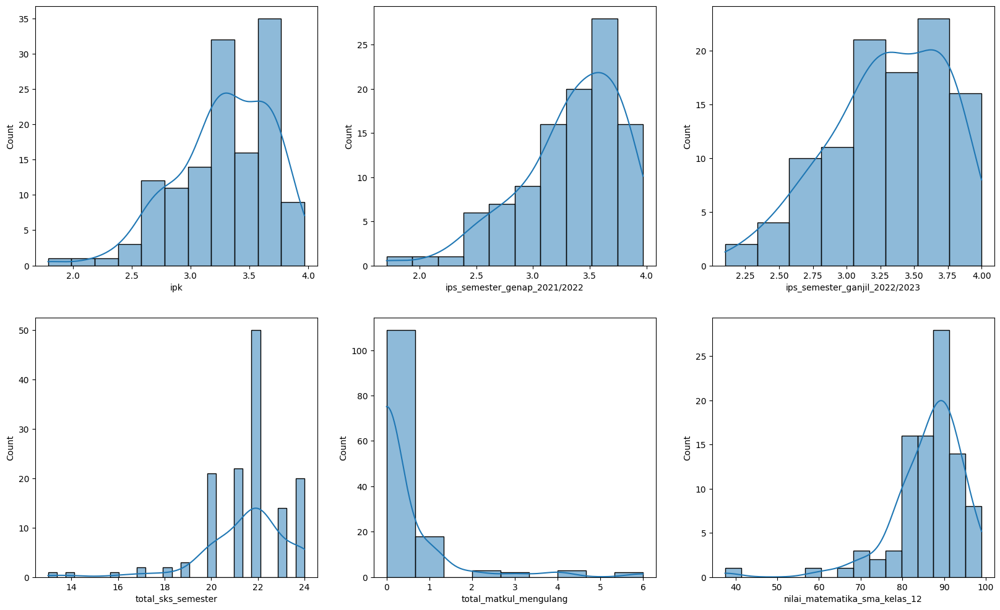

In [137]:
fig, axs = plt.subplots(2, 3, figsize=[20, 12])

for index, data in enumerate(missing_value_numerical.columns):
    sns.histplot(data=missing_value_numerical[data].astype(float), kde=True, ax=axs[index//3, index%3])

In [138]:
display(missing_value_numerical.median())

ipk                               3.32
ips_semester_genap_2021/2022      3.41
ips_semester_ganjil_2022/2023     3.34
total_sks_semester               22.00
total_matkul_mengulang            0.00
nilai_matematika_sma_kelas_12    89.00
dtype: float64

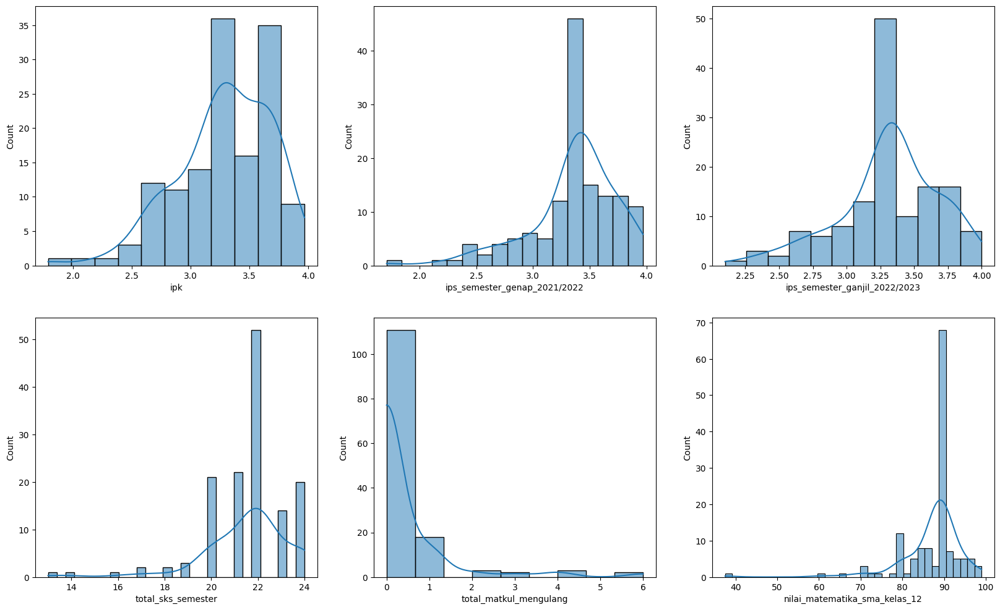

In [139]:
missing_value_numerical = missing_value_numerical.fillna(missing_value_numerical.median())

fig, axs = plt.subplots(2, 3, figsize=[20, 12])
for index, data in enumerate(missing_value_numerical.columns):
    sns.histplot(data=missing_value_numerical[data].astype(float), kde=True, ax=axs[index//3, index%3])

In [140]:
missing_value_columns[list_missing_value_numerical] = missing_value_numerical

### Categorical Data

Untuk pengisian data kategorikal, digunakan data modus dari masing-masing kolom untuk mengisi data yang kosong

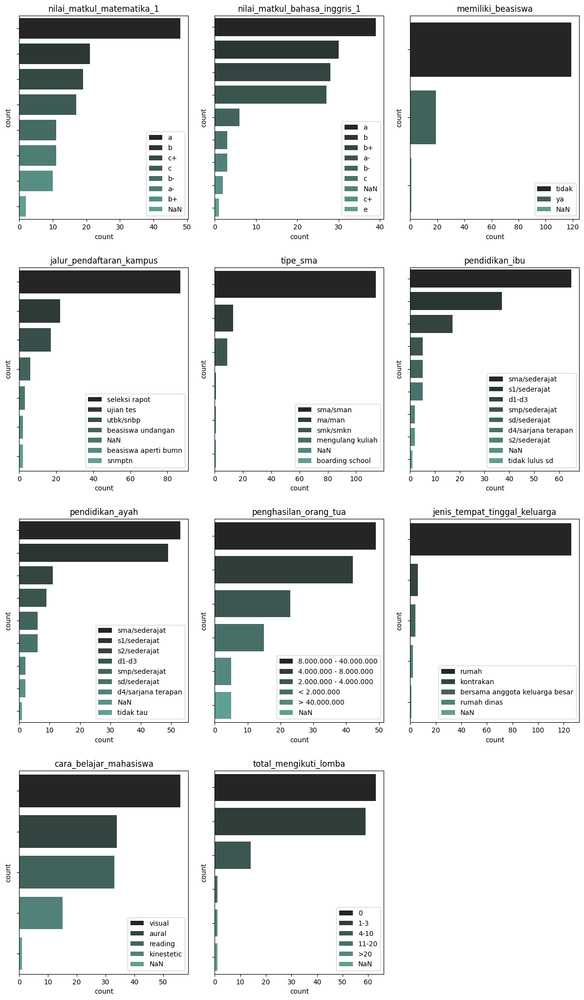

In [141]:
list_missing_value_categorical = missing_value_columns.columns[missing_value_columns.isna().any()].tolist()
list_missing_value_categorical.remove('platform_belajar_online')

missing_value_categorical = missing_value_columns[list_missing_value_categorical]

fig, axs = plt.subplots(4, 3, figsize=[12, 20])
plt.tight_layout(pad=0.4, w_pad=0.8, h_pad=5.0)

# TODO (opsional): tambahkan penjelasan pada bagian looping ini

### Menggunakan list posisi gambar (figure) untuk masing-masing kolom pada variable axs
### dengan data masing-masing kolom di variable missing_value_categorical
### yang bertujuan melakukan plotting data kategorik
for ax, data in zip(axs.flatten(), missing_value_categorical.columns):
    sns.countplot(data=missing_value_categorical.fillna('NaN'), y=data,
                  hue=data, dodge=False,
                  hue_order=missing_value_categorical.fillna('NaN')[data].value_counts().index,
                  order=missing_value_categorical.fillna('NaN')[data].value_counts().index,
                  palette="dark:#5A9", ax=ax)
    
    ax.set_title(data)
    ax.set_ylabel('count')
    ax.set_yticklabels([])
    ax.legend(loc='lower right').set_title('')

for ax in axs.flatten()[len(missing_value_categorical.columns):]:
    ax.set_axis_off() 

In [142]:
missing_value_categorical.mode().iloc[0]

nilai_matkul_matematika_1                             a
nilai_matkul_bahasa_inggris_1                         a
memiliki_beasiswa                                 tidak
jalur_pendaftaran_kampus                  seleksi rapot
tipe_sma                                       sma/sman
pendidikan_ibu                            sma/sederajat
pendidikan_ayah                           sma/sederajat
penghasilan_orang_tua            8.000.000 - 40.000.000
jenis_tempat_tinggal_keluarga                     rumah
cara_belajar_mahasiswa                           visual
total_mengikuti_lomba                                 0
Name: 0, dtype: object

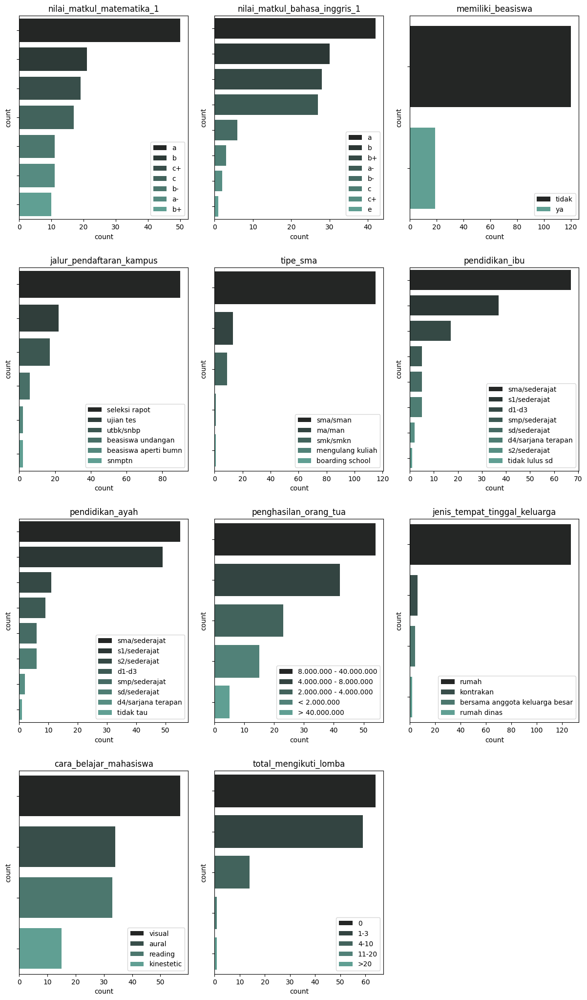

In [143]:
missing_value_categorical = missing_value_categorical.fillna(missing_value_categorical.mode().iloc[0])

missing_value_columns[list_missing_value_categorical] = missing_value_categorical

fig, axs = plt.subplots(4, 3, figsize=[12, 20])
plt.tight_layout(pad=0.4, w_pad=0.8, h_pad=5.0)

for ax, data in zip(axs.flatten(), missing_value_categorical.columns):
    sns.countplot(data=missing_value_categorical.fillna('NaN'), y=data,
                  hue=data, dodge=False,
                  hue_order=missing_value_categorical.fillna('NaN')[data].value_counts().index,
                  order=missing_value_categorical.fillna('NaN')[data].value_counts().index,
                  palette="dark:#5A9", ax=ax)
    
    ax.set_title(data)
    ax.set_ylabel('count')
    ax.set_yticklabels([])
    ax.legend(loc='lower right').set_title('')

for ax in axs.flatten()[len(missing_value_categorical.columns):]:
    ax.set_axis_off() 

### Handling Multi Valued Column

Mengecek apakah nilai unik yang paling dominan atau yang menjadi modus pada kolom yang dapat memiliki nilai unik lebih dari satu pada setiap kolomnya

In [144]:
missing_value_multi_value = missing_value_columns['platform_belajar_online']

# print(f'Column Name: {missing_value_multi_value.name} | Unique Total: {missing_value_multi_value.nunique()} | Data types: {missing_value_multi_value.dtype}')
# print(f'Unique Value With Total Each Data: {missing_value_multi_value.value_counts(dropna=False)}')

dict_unique_value_multi_value_column = {}
multi_value_unique_value_counts = missing_value_multi_value.value_counts()

for key, value in zip(multi_value_unique_value_counts.index, multi_value_unique_value_counts.values):
    for item in key.split(', '):
        if item not in dict_unique_value_multi_value_column:
            dict_unique_value_multi_value_column[item] = value
        else:
            dict_unique_value_multi_value_column[item] += value

pd.DataFrame({
    'Name': dict_unique_value_multi_value_column.keys(),
    'Count': dict_unique_value_multi_value_column.values()
}).sort_values(by=['Count'], ascending=False)

,Name,Count
0,tidak ada,91
1,ruangguru,16
3,coursera,16
2,zenius,13
4,udemy,10
5,dicoding,10
6,sanbercode,7
8,sololearn,6
9,hackerrank,3
7,youtube,2


In [145]:
### dikarenakan data pada kolom 'platform_belajar_online' memiliki modus yaitu 'tidak ada',
### maka data missing value pada kolom 'platform_belajar_online' diubah dengan value 'tidak ada'

missing_value_multi_value = missing_value_multi_value.fillna(missing_value_multi_value.mode().iloc[0])

missing_value_columns['platform_belajar_online'] = missing_value_multi_value

print(f'Column Name: {missing_value_multi_value.name} | Unique Total: {missing_value_multi_value.nunique()} | Data types: {missing_value_multi_value.dtype}')
print(f'Unique Value With Total Each Data: {missing_value_multi_value.value_counts(dropna=False)}')

Column Name: platform_belajar_online | Unique Total: 31 | Data types: object
Unique Value With Total Each Data: platform_belajar_online
tidak ada                                        94
ruangguru                                         4
ruangguru, zenius                                 4
coursera, ruangguru, zenius                       3
udemy, dicoding, sanbercode                       2
zenius                                            2
coursera                                          2
youtube                                           2
coursera, zenius                                  2
coursera, ruangguru                               2
udemy                                             2
coursera, udemy                                   1
dicoding, sololearn                               1
coursera, hackerrank, udemy, sololearn            1
coursera, dicoding, sololearn, sanbercode         1
hackerrank, dicoding, sololearn                   1
built with angga                

### Combine All Missing Data

In [146]:
missing_value_columns.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 139 entries, 0 to 138
Data columns (total 21 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   jenis_kelamin                  139 non-null    object 
 1   tahun_lahir                    139 non-null    object 
 2   ipk                            139 non-null    float32
 3   ips_semester_genap_2021/2022   139 non-null    float32
 4   ips_semester_ganjil_2022/2023  139 non-null    float32
 5   nilai_matkul_matematika_1      139 non-null    object 
 6   nilai_matkul_bahasa_inggris_1  139 non-null    object 
 7   total_sks_semester             139 non-null    float64
 8   total_matkul_mengulang         139 non-null    float32
 9   memiliki_beasiswa              139 non-null    object 
 10  jalur_pendaftaran_kampus       139 non-null    object 
 11  tipe_sma                       139 non-null    object 
 12  nilai_matematika_sma_kelas_12  139 non-null    flo

In [147]:
df_cleaned[missing_value_columns.columns] = missing_value_columns

df_cleaned.isna().any()

nama_kelas                             False
jenis_kelamin                          False
tahun_lahir                            False
tempat_tinggal_kuliah                  False
provinsi_asal                          False
ipk                                    False
ips_semester_genap_2021/2022           False
ips_semester_ganjil_2022/2023          False
nilai_matkul_matematika_1              False
nilai_matkul_bahasa_inggris_1          False
total_sks_semester                     False
total_matkul_mengulang                 False
memiliki_beasiswa                      False
jalur_pendaftaran_kampus               False
tipe_sma                               False
latar_belakang_sma                     False
nilai_matematika_sma_kelas_12          False
pendidikan_ibu                         False
pendidikan_ayah                        False
jumlah_saudara                         False
role_model_keluarga                    False
penghasilan_orang_tua                  False
jenis_temp

## Detect Value on Multi Valued Columns

In [148]:
list_multi_value = [
    'role_model_keluarga',
    'platform_belajar_online',
    'sosial_media',
    'genre_permainan',
    'jenis_organisasi',
    'jenis_ukm',
#     'tipe_pekerjaan_selama_kuliah'
]

In [149]:
for column, value in df_cleaned[list_multi_value].items():
    print(f'Column Name: {column} | Unique Total: {value.nunique()} | Data types: {value.dtype}')
    print(f'Unique Value Count: {value.value_counts(dropna=False)}')
    print('='*100)
    print()

Column Name: role_model_keluarga | Unique Total: 9 | Data types: object
Unique Value Count: role_model_keluarga
ayah                   44
tidak ada / rahasia    44
ibu                    39
kakak                   4
ibu, ayah               4
kakek                   1
ibu, kakak              1
ayah, ibu               1
paman                   1
Name: count, dtype: int64

Column Name: platform_belajar_online | Unique Total: 31 | Data types: object
Unique Value Count: platform_belajar_online
tidak ada                                        94
ruangguru                                         4
ruangguru, zenius                                 4
coursera, ruangguru, zenius                       3
udemy, dicoding, sanbercode                       2
zenius                                            2
coursera                                          2
youtube                                           2
coursera, zenius                                  2
coursera, ruangguru                   

In [150]:
list_multivalue_change_value = {
    'role_model_keluarga':'tidak ada / rahasia',
    'platform_belajar_online':'tidak ada',
    'sosial_media':'tidak menggunakan sosial media',
    'genre_permainan':'tidak bermain game',
    'jenis_organisasi':'tidak mengikuti organisasi',
    'jenis_ukm':'tidak mengikuti kegiatan ukm'
}
no_answer_thresshold = 30.0
list_multivalue_dropped = {}

for column, data, in list_multivalue_change_value.items():
    temp = df_cleaned.loc[df_cleaned[column] == data, column].count()
    if temp / len(df_cleaned) * 100 > missing_data_thresshold:
        list_multivalue_dropped[column] = temp / len(df_cleaned) * 100
    
    print(f'Name: {column}\nNo Answer Data Percentage: {temp / len(df_cleaned) * 100}')
    print('='*100)
    print()

Name: role_model_keluarga
No Answer Data Percentage: 31.654676258992804

Name: platform_belajar_online
No Answer Data Percentage: 67.62589928057554

Name: sosial_media
No Answer Data Percentage: 3.597122302158273

Name: genre_permainan
No Answer Data Percentage: 20.863309352517987

Name: jenis_organisasi
No Answer Data Percentage: 23.741007194244602

Name: jenis_ukm
No Answer Data Percentage: 37.410071942446045



In [151]:
list_multivalue_dropped

{'role_model_keluarga': 31.654676258992804,
 'platform_belajar_online': 67.62589928057554,
 'jenis_ukm': 37.410071942446045}

### Drop Column Above Threshold

In [152]:
df_cleaned = df_cleaned.drop(columns=[key for key, value in list_multivalue_dropped.items() if value > no_answer_thresshold])

## Convert Cleaned Dataframe to CSV

Data yang belum diterapkan data encoding dan dimensional reduction akan digunakan pada pemodelan clustering menggunakan metode K-Prototypes

In [153]:
df_cleaned.to_csv('./data/data_kuisioner_mahasiswa_cleaned.csv', index=False)

# Data Encoding

Reference:
<ol>
    
  <li>For Ordinal Encoding vs One Hot Encoding</li>
    <a href="https://datascience.stackexchange.com/questions/9443/when-to-use-one-hot-encoding-vs-labelencoder-vs-dictvectorizor">https://datascience.stackexchange.com/questions/9443/when-to-use-one-hot-encoding-vs-labelencoder-vs-dictvectorizor</a><br>
    <a href="https://medium.com/@milanbhadja7932/one-hot-encoding-and-label-encoding-3a329481984e">https://medium.com/@milanbhadja7932/one-hot-encoding-and-label-encoding-3a329481984e</a><br>
    <a href="https://www.formpl.us/blog/nominal-ordinal-data">https://www.formpl.us/blog/nominal-ordinal-data</a><br>
    
  <li>For Multi Data Column</li>
    <a href="https://stackoverflow.com/questions/37646473/how-could-i-do-one-hot-encoding-with-multiple-values-in-one-cell">https://stackoverflow.com/questions/37646473/how-could-i-do-one-hot-encoding-with-multiple-values-in-one-cell</a><br>
    <a href="https://stats.stackexchange.com/questions/467633/what-exactly-is-multi-hot-encoding-and-how-is-it-different-from-one-hot">https://stats.stackexchange.com/questions/467633/what-exactly-is-multi-hot-encoding-and-how-is-it-different-from-one-hot</a><br>
    <a href="https://stackoverflow.com/questions/67108935/dataframe-with-multiple-values-in-each-column-how-to-one-hot-encode-them-under">https://stackoverflow.com/questions/67108935/dataframe-with-multiple-values-in-each-column-how-to-one-hot-encode-them-under</a><br>
    <a href="https://stats.stackexchange.com/questions/596523/encode-multiple-values-of-an-attributes-in-pandas">https://stats.stackexchange.com/questions/596523/encode-multiple-values-of-an-attributes-in-pandas</a><br>
    <a href="https://stackoverflow.com/questions/60153981/scikit-learn-one-hot-encoding-certain-columns-of-a-pandas-dataframe">https://stackoverflow.com/questions/60153981/scikit-learn-one-hot-encoding-certain-columns-of-a-pandas-dataframe</a><br>
</ol>


In [154]:
df_transformed = df_cleaned.drop(columns=['nama_kelas', 'rating_kesan_mata_kuliah']).copy()

In [155]:
total_column_before_encoding = len(df_transformed.columns)
print(f'Total Column Before Encoding: {total_column_before_encoding}')
print('-'*100)
print()

# show_columns_unique_value(df_transformed)

Total Column Before Encoding: 31
----------------------------------------------------------------------------------------------------



In [156]:
# df_transformed.info()

## Ordinal Encoding for Ordinal and Interval Data

In [157]:
list_ordinal_data = [
    'tahun_lahir',
    'nilai_matkul_matematika_1',
    'nilai_matkul_bahasa_inggris_1',
    'memiliki_beasiswa',
    'pendidikan_ibu',
    'pendidikan_ayah',
    'jumlah_saudara',
    'penghasilan_orang_tua',
    'waktu_khusus_belajar',
    'suka_lomba',
    'total_mengikuti_lomba',
    'total_akses_sosial_media',
    'estimasi_waktu_perjalanan_ke_kampus',
]

columns_ordinal_data = df_transformed[list_ordinal_data].copy()
columns_ordinal_data.head()

,tahun_lahir,nilai_matkul_matematika_1,nilai_matkul_bahasa_inggris_1,memiliki_beasiswa,pendidikan_ibu,pendidikan_ayah,jumlah_saudara,penghasilan_orang_tua,waktu_khusus_belajar,suka_lomba,total_mengikuti_lomba,total_akses_sosial_media,estimasi_waktu_perjalanan_ke_kampus
0,2000,b,a-,tidak,sma/sederajat,sma/sederajat,1,> 40.000.000,ya,4.0,11-20,3-5,<15
1,2001,b,b,tidak,sma/sederajat,sma/sederajat,1,2.000.000 - 4.000.000,ya,2.0,0,3-5,15-30
2,2003,a,a-,tidak,s1/sederajat,s1/sederajat,1,4.000.000 - 8.000.000,ya,2.0,0,1-3,60-120
3,2003,b,a,tidak,s1/sederajat,s2/sederajat,2,8.000.000 - 40.000.000,ya,2.0,0,5-10,30-60
4,2003,c+,b-,tidak,d1-d3,sma/sederajat,2,4.000.000 - 8.000.000,ya,2.0,0,1-3,<15


In [158]:
# Ordinal Encoder Function

def oe_tahun_lahir(x):
    unique_value = ['1999', '2000', '2001', '2003', '2002', '2004']
    
    return unique_value.index(x)

def oe_nilai_matkul_matematika_1(x):
    unique_value = ['c', 'c+', 'b-', 'b', 'b+', 'a-', 'a']
    
    return unique_value.index(x)

def oe_nilai_matkul_bahasa_inggris_1(x):
    unique_value = ['e', 'c', 'c+', 'b-', 'b', 'b+', 'a-', 'a']
    
    return unique_value.index(x)

def oe_memiliki_beasiswa(x):
    unique_value = ['tidak', 'ya']
    
    return unique_value.index(x)

def oe_pendidikan_ibu(x):
    unique_value = ['tidak lulus sd', 'sd/sederajat', 'smp/sederajat', 'sma/sederajat', 'd1-d3', 'd4/sarjana terapan', 's1/sederajat', 's2/sederajat']
    
    return unique_value.index(x)

def oe_pendidikan_ayah(x):
    unique_value = ['tidak tau', 'sd/sederajat', 'smp/sederajat', 'sma/sederajat', 'd1-d3', 'd4/sarjana terapan', 's1/sederajat', 's2/sederajat']
    
    return unique_value.index(x)

def oe_jumlah_saudara(x):
    unique_value = ['0', '1', '2', '3', '4', '>4']
    
    return unique_value.index(x)

def oe_penghasilan_orang_tua(x):
    unique_value = ['< 2.000.000', '2.000.000 - 4.000.000', '4.000.000 - 8.000.000', '8.000.000 - 40.000.000', '> 40.000.000']
    
    return unique_value.index(x)

# def oe_rating_kesan_mata_kuliah(x):
#     unique_value = ['1.0', '2.0', '3.0', '4.0']
    
#     return unique_value.index(x)

def oe_waktu_khusus_belajar(x):
    unique_value = ['tidak', 'ya']
    
    return unique_value.index(x)

def oe_suka_lomba(x):
    
    return x-1

def oe_total_mengikuti_lomba(x):
    unique_value = ['0', '1-3', '4-10', '11-20', '>20']
    
    return unique_value.index(x)

def oe_total_akses_sosial_media(x):
    unique_value = ['0', '<1', '1-3', '3-5', '5-10', '>10']
    
    return unique_value.index(x)

def oe_estimasi_waktu_perjalanan_ke_kampus(x):
    unique_value = ['<15', '15-30', '30-60', '60-120', '>120']
    
    return unique_value.index(x)


In [159]:
for column in list_ordinal_data:
    function_name = f"oe_{column}"
    transform_function = globals()[function_name]
    
    columns_ordinal_data[f'{column}'] = columns_ordinal_data[f'{column}'].apply(transform_function)
    
columns_ordinal_data.head()

,tahun_lahir,nilai_matkul_matematika_1,nilai_matkul_bahasa_inggris_1,memiliki_beasiswa,pendidikan_ibu,pendidikan_ayah,jumlah_saudara,penghasilan_orang_tua,waktu_khusus_belajar,suka_lomba,total_mengikuti_lomba,total_akses_sosial_media,estimasi_waktu_perjalanan_ke_kampus
0,1,3,6,0,3,3,1,4,1,3.0,3,3,0
1,2,3,4,0,3,3,1,1,1,1.0,0,3,1
2,3,6,6,0,6,6,1,2,1,1.0,0,2,3
3,3,3,7,0,6,7,2,3,1,1.0,0,4,2
4,3,1,3,0,4,3,2,2,1,1.0,0,2,0


In [160]:
df_transformed[list_ordinal_data] = columns_ordinal_data

## One Hot Encoding for Nominal Data

In [161]:
list_nominal_data = [
    'jenis_kelamin',
    'tempat_tinggal_kuliah',
    'provinsi_asal',
    'jalur_pendaftaran_kampus',    
    'tipe_sma',
    'latar_belakang_sma',
    'jenis_tempat_tinggal_keluarga',
    'cara_belajar_mahasiswa',
    'akses_pembelajaran'
]

# show_columns_unique_value(df_transformed[list_nominal_data])

In [162]:
df_transformed = pd.get_dummies(df_transformed,
                                prefix=df_transformed[list_nominal_data].columns.tolist(),
                                columns=list_nominal_data,
                                dtype=float,
                                drop_first=False)

In [163]:
temp1 = pd.DataFrame()
for column in list_nominal_data:
    temp2 = [col for col in df_transformed if col.startswith(column)]
    temp2 = df_transformed[temp2].copy()
    
    temp1 = pd.concat([temp1, temp2], axis=1)

temp1

,jenis_kelamin_laki-laki,jenis_kelamin_perempuan,tempat_tinggal_kuliah_apartemen,tempat_tinggal_kuliah_asrama,tempat_tinggal_kuliah_bersama anggota keluarga besar,tempat_tinggal_kuliah_bersama orang tua,tempat_tinggal_kuliah_kontrakan,tempat_tinggal_kuliah_kos,provinsi_asal_bali,provinsi_asal_bangka belitung,...,jenis_tempat_tinggal_keluarga_bersama anggota keluarga besar,jenis_tempat_tinggal_keluarga_kontrakan,jenis_tempat_tinggal_keluarga_rumah,jenis_tempat_tinggal_keluarga_rumah dinas,cara_belajar_mahasiswa_aural,cara_belajar_mahasiswa_kinestetic,cara_belajar_mahasiswa_reading,cara_belajar_mahasiswa_visual,akses_pembelajaran_daring,akses_pembelajaran_luring
0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
2,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
3,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
4,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
134,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
135,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
136,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
137,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0


In [164]:
print(f'Total Column After Ordinal Encoding: {total_column_before_encoding}')

total_column_after_OHE = len(df_transformed.columns)
print(f'Total Column After Ordinal Encoding + OHE for Nominal Data: {total_column_after_OHE}')

Total Column After Ordinal Encoding: 31
Total Column After Ordinal Encoding + OHE for Nominal Data: 77


## One Hot Encoding for Multi Valued Column

In [165]:
list_multi_value = list(set(list_multi_value) - set(list_multivalue_dropped))

df_encode = df_transformed.copy()

In [166]:
for column, value in df_encode[list_multi_value].items():
    print(f'Column Name: {column} | Unique Total: {value.nunique()} | Data types: {value.dtype}')
    print(f'Unique Value: {value.unique()}')
    print('='*100)
    print()

Column Name: genre_permainan | Unique Total: 43 | Data types: object
Unique Value: ['strategi, multiplayer' 'strategi'
 'multiplayer, strategi, aksi, shooting' 'multiplayer'
 'aksi, petualangan, strategi, teka-teki, olahraga' 'tidak bermain game'
 'aksi, strategi, olahraga, multiplayer'
 'aksi, petualangan, strategi, teka-teki, multiplayer'
 'aksi, petualangan, strategi, multiplayer'
 'strategi, teka-teki, olahraga' 'petualangan, strategi, multiplayer'
 'petualangan' 'aksi, petualangan, strategi'
 'petualangan, strategi, teka-teki'
 'aksi, petualangan, strategi, olahraga, multiplayer' 'aksi, multiplayer'
 'aksi, petualangan, multiplayer' 'aksi, teka-teki' 'strategi, teka-teki'
 'teka-teki' 'petualangan, strategi, teka-teki, olahraga, multiplayer'
 'petualangan, teka-teki, olahraga' 'aksi, strategi' 'olahraga'
 'aksi, petualangan, strategi, teka-teki, olahraga, multiplayer'
 'aksi, strategi, olahraga' 'aksi, strategi, teka-teki'
 'petualangan, teka-teki' 'aksi, strategi, multiplayer'
 '

In [167]:
df_encode[list_multi_value] = df_encode[list_multi_value].applymap(lambda x: x.split(', '))
df_encode[list_multi_value]

,genre_permainan,sosial_media,jenis_organisasi
0,"[strategi, multiplayer]",[tiktok],[organisasi keahlian]
1,[strategi],[instagram],[tidak mengikuti organisasi]
2,"[multiplayer, strategi, aksi, shooting]",[instagram],[himpunan mahasiswa]
3,[multiplayer],"[instagram, twitter, tiktok]",[himpunan mahasiswa]
4,"[aksi, petualangan, strategi, teka-teki, olahr...","[instagram, facebook, tiktok]",[organisasi keagamaan]
...,...,...,...
134,"[aksi, strategi, multiplayer]","[instagram, facebook]",[tidak mengikuti organisasi]
135,"[aksi, strategi, multiplayer]","[instagram, twitter, tiktok]","[organisasi sosial, himpunan mahasiswa, organi..."
136,[shooting],"[instagram, facebook, twitter, tiktok]",[himpunan mahasiswa]
137,"[strategi, teka-teki]","[instagram, tiktok]",[himpunan mahasiswa]


In [168]:
mlb = MultiLabelBinarizer()
for column, data in df_encode[list_multi_value].items():
    mlb_multi_value = mlb.fit_transform(data)
    columns_loc = df_encode.columns.get_loc(column)
    print(f'{column} : {mlb.classes_}')
    print(f'column index: {columns_loc} | total classes: {len(mlb.classes_)}')
#     print(mlb_multi_value)
    
    df_encode = df_encode.drop(columns=column)
    for index_classes, name_classes in enumerate(mlb.classes_):
#         print(f'class index: {columns_loc+index_classes} | class name: {name_classes}')
#         print(f'data:\n{mlb_multi_value[:, index_classes]}')
        df_encode.insert(columns_loc,
                         f'{column}_{name_classes}',
                         mlb_multi_value[:, index_classes])        
    print('='*100)
    print()

genre_permainan : ['aksi' 'multiplayer' 'olahraga' 'petualangan' 'shooting' 'strategi'
 'teka-teki' 'tidak bermain game']
column index: 19 | total classes: 8

sosial_media : ['facebook' 'instagram' 'tidak menggunakan sosial media' 'tiktok'
 'twitter' 'whatsapp' 'youtube']
column index: 17 | total classes: 7

jenis_organisasi : ['himpunan mahasiswa' 'organisasi keagamaan' 'organisasi keahlian'
 'organisasi keprofesian' 'organisasi masyarakat' 'organisasi pengusaha'
 'organisasi sosial' 'penalaran dan keilmuan' 'tidak mengikuti organisasi']
column index: 33 | total classes: 9



In [169]:
temp = [col for col in df_encode if col.startswith('genre_permainan')]
df_encode[temp]

,genre_permainan_tidak bermain game,genre_permainan_teka-teki,genre_permainan_strategi,genre_permainan_shooting,genre_permainan_petualangan,genre_permainan_olahraga,genre_permainan_multiplayer,genre_permainan_aksi
0,0,0,1,0,0,0,1,0
1,0,0,1,0,0,0,0,0
2,0,0,1,1,0,0,1,1
3,0,0,0,0,0,0,1,0
4,0,1,1,0,1,1,0,1
...,...,...,...,...,...,...,...,...
134,0,0,1,0,0,0,1,1
135,0,0,1,0,0,0,1,1
136,0,0,0,1,0,0,0,0
137,0,1,1,0,0,0,0,0


In [170]:
df_transformed = df_encode.copy()

total_column_after_MLB = len(df_transformed.columns)

In [171]:
print(f'Total Column After Ordinal Encoding: {total_column_before_encoding}')

print(f'Total Column After Ordinal Encoding + OHE for Nominal Data: {total_column_after_OHE} (total increase of {total_column_after_OHE-total_column_before_encoding} columns)')
print(f'Total Column After Ordinal Encoding + OHE for Nominal Data + MLB for Multi Value Data: {total_column_after_MLB} (total increase of {total_column_after_MLB-total_column_after_OHE} columns)')
print(f'Total Column Increase: {total_column_after_MLB-total_column_before_encoding}', end=' | ')
print(f'Total One Hot Encoded Data: {(total_column_after_MLB-total_column_before_encoding) + len(list_nominal_data) + len(list_multi_value)}')

Total Column After Ordinal Encoding: 31
Total Column After Ordinal Encoding + OHE for Nominal Data: 77 (total increase of 46 columns)
Total Column After Ordinal Encoding + OHE for Nominal Data + MLB for Multi Value Data: 98 (total increase of 21 columns)
Total Column Increase: 67 | Total One Hot Encoded Data: 79


# Detecting and Handling Outlier

pada bagian ini, digunakan metode interquartil untuk mendeteksi outlier. Lalu, mengubah data yang lebih besar dari batas atas menjadi nilai batas atas interquartil serta mengubah data yang lebih kecil dari batas bawah menjadi nilai batas bawah interquartil.

In [172]:
df_outlier_treatment = df_transformed.copy()

In [173]:
list_numeric_data = [
    'ipk',
    'ips_semester_genap_2021/2022',
    'ips_semester_ganjil_2022/2023',
    'total_sks_semester',
    'total_matkul_mengulang',
    'nilai_matematika_sma_kelas_12'
]

list_column_outlier_treatment = list_numeric_data + list_ordinal_data

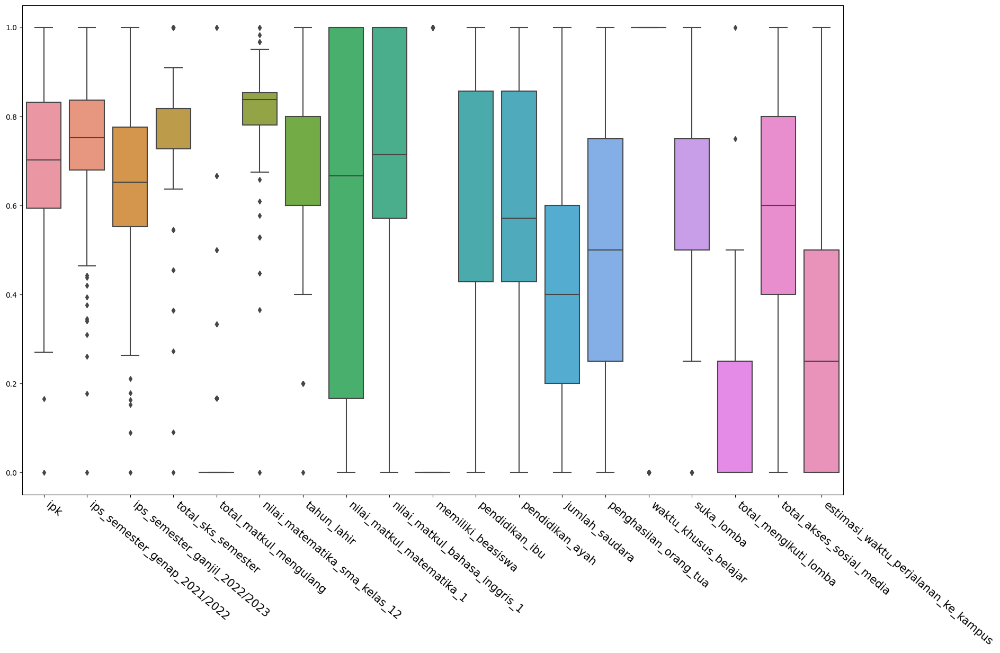

In [174]:
scaler = MinMaxScaler()
temp = df_outlier_treatment[list_column_outlier_treatment].copy()

temp[list_column_outlier_treatment] = scaler.fit_transform(df_outlier_treatment[list_column_outlier_treatment])

plt.figure(figsize=[20, 12])

sns.boxplot(data=temp)

plt.xticks(rotation=-40, ha='left', fontsize=15)

savefig('boxplot_numeric_ordinal_before_outlier_treatment')
plt.show()

In [175]:
def detect_outliers_iqr(data):
    '''
    Fungsi untuk mendeteksi outlier pada data dan mengambil sekumpuilan data yang menjadi outlier,
    berdasarkan pendekatan interquartil range
    
    Input:
        - data: suatu baris data pada suatu kolom di dataset yang ingin dideteksi data outliernya (Pandas Series)
        
    Output:
        sekumpulan data outlier dari suatu kolom dalam bentuk list
    '''
    outliers = []
    
    data = sorted(data)
    Q1 = np.percentile(data, 25)
    Q3 = np.percentile(data, 75)
    IQR = Q3 - Q1
    
    lower_bound = Q1 - 1.5*IQR
    upper_bound = Q3 + 1.5*IQR
    
    for i in data: 
        if (i<lower_bound or i>upper_bound):
            outliers.append(i)
    return outliers

In [176]:
list_column_outlier = []

for column, data in df_outlier_treatment[list_column_outlier_treatment].items():
    sample_outliers = detect_outliers_iqr(data)
    if len(sample_outliers) > 0:
        print(column)
        print("Outliers from IQR method: ", sample_outliers)
        
        list_column_outlier.append(column)
    
        print('='*50)

ipk
Outliers from IQR method:  [1.7899999618530273, 2.1500000953674316]
ips_semester_genap_2021/2022
Outliers from IQR method:  [1.7100000381469727, 2.109999895095825, 2.299999952316284, 2.4100000858306885, 2.4800000190734863, 2.4800000190734863, 2.490000009536743, 2.559999942779541, 2.5999999046325684, 2.6600000858306885, 2.700000047683716, 2.7100000381469727]
ips_semester_ganjil_2022/2023
Outliers from IQR method:  [2.0999999046325684, 2.2699999809265137, 2.390000104904175, 2.4100000858306885, 2.440000057220459, 2.5]
total_sks_semester
Outliers from IQR method:  [13.0, 14.0, 16.0, 17.0, 17.0, 18.0, 18.0, 19.0, 19.0, 19.0, 24.0, 24.0, 24.0, 24.0, 24.0, 24.0, 24.0, 24.0, 24.0, 24.0, 24.0, 24.0, 24.0, 24.0, 24.0, 24.0, 24.0, 24.0, 24.0, 24.0]
total_matkul_mengulang
Outliers from IQR method:  [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 2.0, 2.0, 3.0, 3.0, 4.0, 4.0, 4.0, 6.0, 6.0]
nilai_matematika_sma_kelas_12
Outliers from IQR method:  

In [177]:
list_column_outlier = [item for item in list_column_outlier if item not in ['memiliki_beasiswa', 'waktu_khusus_belajar', 'total_matkul_mengulang']]
list_column_outlier

['ipk',
 'ips_semester_genap_2021/2022',
 'ips_semester_ganjil_2022/2023',
 'total_sks_semester',
 'nilai_matematika_sma_kelas_12',
 'tahun_lahir',
 'suka_lomba',
 'total_mengikuti_lomba']

In [178]:
def outlier_treatment_iqr(data, column):
    '''
    Fungsi untuk mengubah data outlier dari sekumpulan kolom yang diberikan kepada fungsi ini, 
    dengan cara mengubah  mengubah data yang lebih besar dari batas atas menjadi nilai batas atas interquartil 
    serta mengubah data yang lebih kecil dari batas bawah menjadi nilai batas bawah interquartil.
    
    Input:
        - data: suatu baris data pada suatu kolom di dataset yang akan dilakukan penanganan data outlier (Pandas Series)
        
    Output:
        Suatu kolom dimana data outlier yang telah diubah kedalam batasan interquartil dari masing-masing kolom
    '''
    
    data_sorted = sorted(data)
    Q1 = np.percentile(data_sorted, 25)
    Q3 = np.percentile(data_sorted, 75)
    IQR = Q3 - Q1
    
    lower_bound = Q1 - 1.5*IQR
    upper_bound = Q3 + 1.5*IQR
    if column not in list_numeric_data:
        cat_inside_bound = [item for item in np.unique(data) if (item > lower_bound) & (item < upper_bound)]
        lower_bound = cat_inside_bound[0]
        upper_bound = cat_inside_bound[-1]
    
    data_treated = np.where(data<lower_bound, lower_bound, data)
    data_treated = np.where(data_treated>upper_bound, upper_bound, data_treated)

    return data_treated

In [179]:
dict_outlier_treated = {}

for column, data in df_outlier_treatment[list_column_outlier].items():
    dict_outlier_treated[column] = outlier_treatment_iqr(data, column)

In [180]:
df_outlier_treatment[list_column_outlier] = pd.DataFrame(dict_outlier_treated)[list_column_outlier]

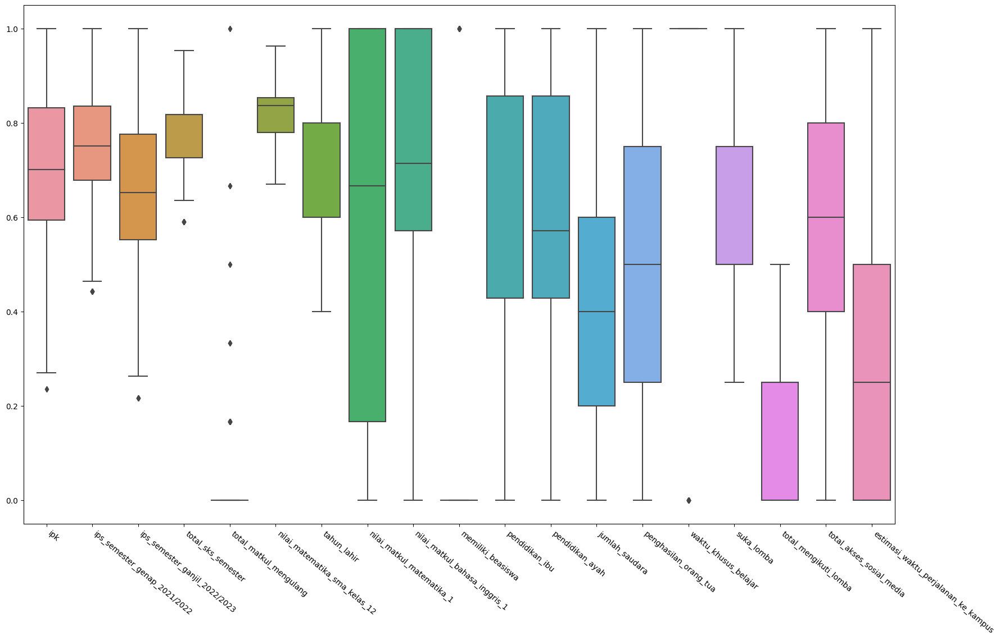

In [181]:
temp = df_outlier_treatment[list_column_outlier_treatment].copy()

temp[list_column_outlier_treatment] = scaler.transform(df_outlier_treatment[list_column_outlier_treatment])

plt.figure(figsize=[20, 12])

sns.boxplot(data=temp)

plt.xticks(rotation=-40, ha='left')

savefig('boxplot_numeric_ordinal_after_outlier_treatment')
plt.show()

In [182]:
df_outlier_treatment.to_csv('./data/dataset_train_clean_data_only.csv', index=False)

# Exploratory Data Analysis

### Data Statistik

In [183]:
df_outlier_treatment.head()

,tahun_lahir,ipk,ips_semester_genap_2021/2022,ips_semester_ganjil_2022/2023,nilai_matkul_matematika_1,nilai_matkul_bahasa_inggris_1,total_sks_semester,total_matkul_mengulang,memiliki_beasiswa,nilai_matematika_sma_kelas_12,...,jenis_tempat_tinggal_keluarga_bersama anggota keluarga besar,jenis_tempat_tinggal_keluarga_kontrakan,jenis_tempat_tinggal_keluarga_rumah,jenis_tempat_tinggal_keluarga_rumah dinas,cara_belajar_mahasiswa_aural,cara_belajar_mahasiswa_kinestetic,cara_belajar_mahasiswa_reading,cara_belajar_mahasiswa_visual,akses_pembelajaran_daring,akses_pembelajaran_luring
0,2,3.01,2.95,3.10,3,6,22.0,1.0,0,78.75,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
1,2,3.25,3.19,3.31,3,4,22.0,0.0,0,89.00,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
2,3,3.29,3.33,3.08,6,6,22.0,0.0,0,89.00,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
3,3,3.33,3.56,3.46,3,7,22.0,1.0,0,82.00,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
4,3,3.32,3.41,3.34,1,3,22.0,0.0,0,89.00,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0


In [184]:
df_outlier_treatment.columns.tolist()

['tahun_lahir',
 'ipk',
 'ips_semester_genap_2021/2022',
 'ips_semester_ganjil_2022/2023',
 'nilai_matkul_matematika_1',
 'nilai_matkul_bahasa_inggris_1',
 'total_sks_semester',
 'total_matkul_mengulang',
 'memiliki_beasiswa',
 'nilai_matematika_sma_kelas_12',
 'pendidikan_ibu',
 'pendidikan_ayah',
 'jumlah_saudara',
 'penghasilan_orang_tua',
 'waktu_khusus_belajar',
 'suka_lomba',
 'total_mengikuti_lomba',
 'sosial_media_youtube',
 'sosial_media_whatsapp',
 'sosial_media_twitter',
 'sosial_media_tiktok',
 'sosial_media_tidak menggunakan sosial media',
 'sosial_media_instagram',
 'sosial_media_facebook',
 'total_akses_sosial_media',
 'genre_permainan_tidak bermain game',
 'genre_permainan_teka-teki',
 'genre_permainan_strategi',
 'genre_permainan_shooting',
 'genre_permainan_petualangan',
 'genre_permainan_olahraga',
 'genre_permainan_multiplayer',
 'genre_permainan_aksi',
 'jenis_organisasi_tidak mengikuti organisasi',
 'jenis_organisasi_penalaran dan keilmuan',
 'jenis_organisasi_org

In [185]:
df_outlier_treatment.describe()

,tahun_lahir,ipk,ips_semester_genap_2021/2022,ips_semester_ganjil_2022/2023,nilai_matkul_matematika_1,nilai_matkul_bahasa_inggris_1,total_sks_semester,total_matkul_mengulang,memiliki_beasiswa,nilai_matematika_sma_kelas_12,...,jenis_tempat_tinggal_keluarga_bersama anggota keluarga besar,jenis_tempat_tinggal_keluarga_kontrakan,jenis_tempat_tinggal_keluarga_rumah,jenis_tempat_tinggal_keluarga_rumah dinas,cara_belajar_mahasiswa_aural,cara_belajar_mahasiswa_kinestetic,cara_belajar_mahasiswa_reading,cara_belajar_mahasiswa_visual,akses_pembelajaran_daring,akses_pembelajaran_luring
count,139.000000,139.000000,139.000000,139.000000,139.000000,139.000000,139.000000,139.000000,139.000000,139.000000,...,139.000000,139.000000,139.000000,139.000000,139.000000,139.000000,139.000000,139.000000,139.000000,139.000000
mean,3.158273,3.292734,3.381151,3.318669,3.589928,5.330935,21.676259,0.388489,0.136691,87.863312,...,0.028777,0.043165,0.913669,0.014388,0.244604,0.107914,0.237410,0.410072,0.302158,0.697842
std,0.782591,0.388010,0.329879,0.355875,2.245165,1.534098,1.242169,1.032169,0.344763,4.655158,...,0.167784,0.203964,0.281868,0.119517,0.431407,0.311393,0.427034,0.493625,0.460854,0.460854
min,2.000000,2.305000,2.712500,2.512500,0.000000,0.000000,19.500000,0.000000,0.000000,78.750000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.000000,3.085000,3.245000,3.150000,1.000000,4.000000,21.000000,0.000000,0.000000,85.500000,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,3.000000,3.320000,3.410000,3.340000,4.000000,5.000000,22.000000,0.000000,0.000000,89.000000,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,4.000000,3.605000,3.600000,3.575000,6.000000,7.000000,22.000000,0.000000,0.000000,90.000000,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000
max,5.000000,3.970000,3.970000,4.000000,6.000000,7.000000,23.500000,6.000000,1.000000,96.750000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### Total Responden Setiap Mata Kuliah

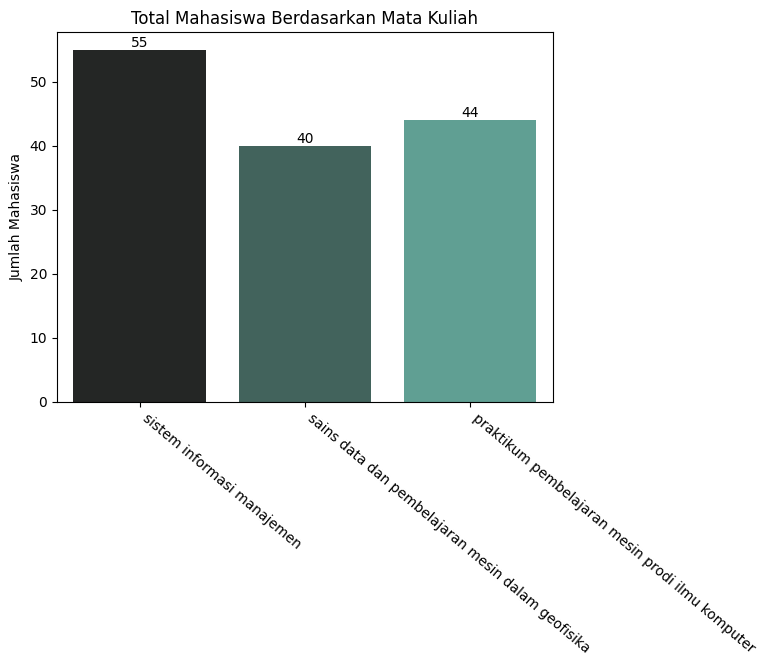

In [186]:
temp = sns.countplot(x=df_cleaned['nama_kelas'], 
                     palette="dark:#5A9")

temp.bar_label(temp.containers[0])

plt.title('Total Mahasiswa Berdasarkan Mata Kuliah', fontsize=12)
plt.ylabel('Jumlah Mahasiswa')
plt.xlabel('')
plt.xticks(rotation=-40, ha='left', fontsize=10)

plt.legend('',frameon=False)

savefig('questionnaire_correspondent_distribution')
plt.show() 

### Hasil dari Sebelum dengan Setelah Penerapan Data Encoding

In [187]:
ohe_columns = []
ohe_list = list_nominal_data + list_multi_value

for column in ohe_list:
    ohe_columns.extend([col for col in df_outlier_treatment if col.startswith(column)])

In [188]:
list_data_types = ['Numeric Data', 'Ordinal Data (Ordinal Encoded)', 'Nominal Data (OHE)']
before_encoding_counts = np.array([len(list_numeric_data), len(list_ordinal_data), len(ohe_list)])
after_encoding_counts = np.array([len(list_numeric_data), len(list_ordinal_data), len(ohe_columns)])

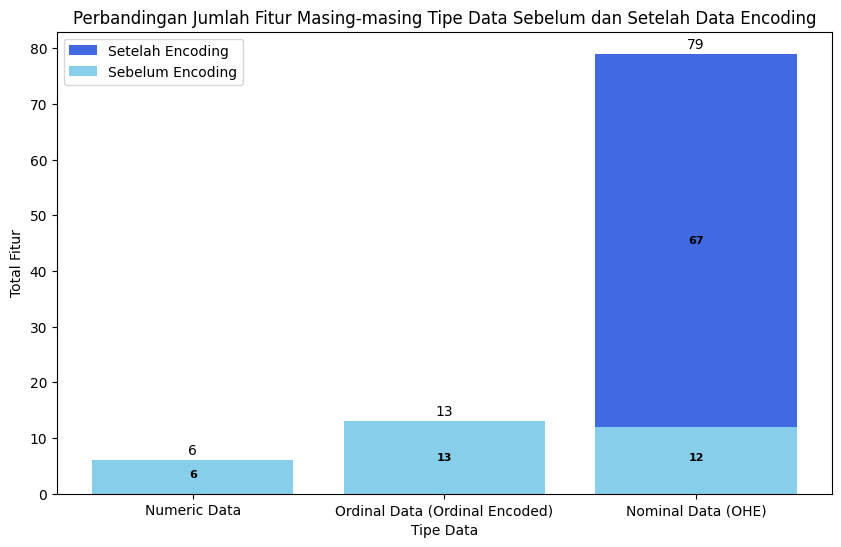

In [189]:
fig, ax = plt.subplots(figsize=[10, 6])

ax.bar(list_data_types, after_encoding_counts-before_encoding_counts, bottom=before_encoding_counts,
        label='Setelah Encoding', color='royalblue')
ax.bar(list_data_types, before_encoding_counts,
        label='Sebelum Encoding', color='skyblue')

addBarLabels(list_data_types, after_encoding_counts + 1,
             texts=after_encoding_counts, ax=ax)

for bar in ax.patches:
    left, bottom, width, height = bar.get_bbox().bounds
    if height != 0.0:
        ax.text(
            left + width / 2,
            bottom + height // 2,
            round(height),
            ha='center',
            color='black',
            weight='bold',
            size=8
        )

ax.set_xlabel('Tipe Data')
ax.set_ylabel('Total Fitur')
ax.set_title('Perbandingan Jumlah Fitur Masing-masing Tipe Data Sebelum dan Setelah Data Encoding')

ax.legend()
savefig('comparison_data_types')
plt.show()

## Data Distribution

### Numerical Data

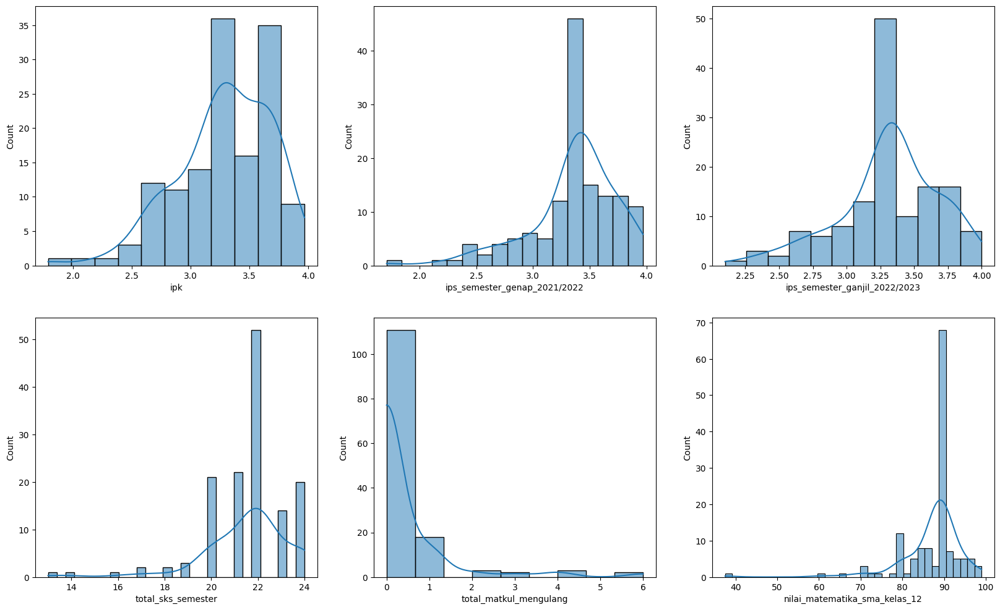

In [190]:
fig, axs = plt.subplots(2, 3, figsize=[20, 12])
for index, data in enumerate(df_outlier_treatment[list_numeric_data].columns):
    sns.histplot(data=missing_value_numerical[data].astype(float), kde=True, ax=axs[index//3, index%3])
    
savefig('numeric_data_distribution')

### Ordinal and Interval Data

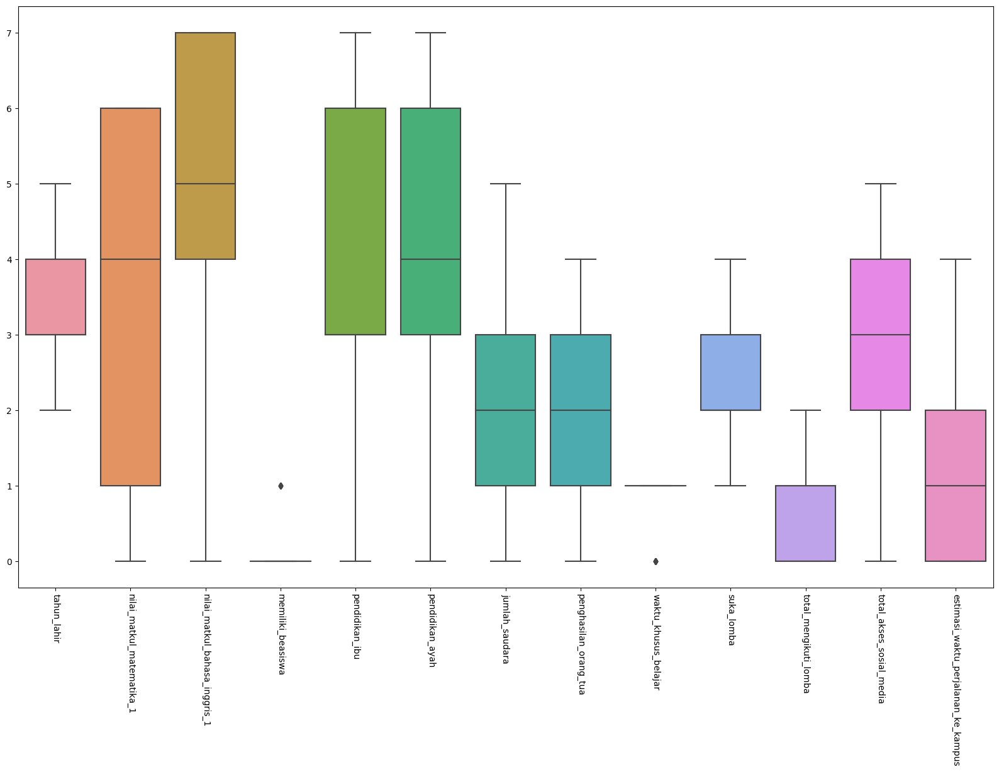

In [191]:
plt.figure(figsize=[20, 12])

sns.boxplot(data=df_outlier_treatment[list_ordinal_data])

plt.xticks(rotation=270)

plt.show()

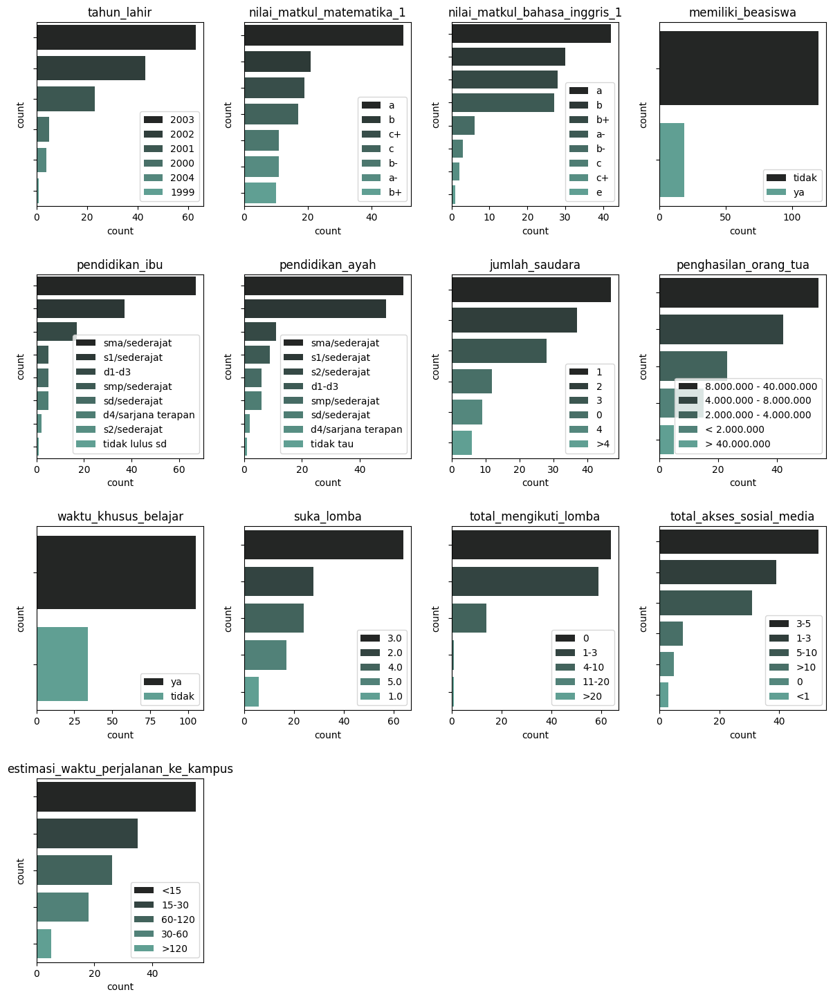

In [192]:
fig, axs = plt.subplots(4, 4, figsize=[12, 14])
plt.tight_layout(pad=0.4, w_pad=0.8, h_pad=5.0)

for ax, data in zip(axs.flatten(), list_ordinal_data):
    sns.countplot(data=df_cleaned, y=data,
                  hue=data, dodge=False,
                  hue_order=df_cleaned[data].value_counts().index,
                  order=df_cleaned[data].value_counts().index,
                  palette="dark:#5A9", ax=ax)
    
    ax.set_title(data)
    ax.set_ylabel('count')
    ax.set_yticklabels([])
    ax.legend(loc='lower right').set_title('')

for ax in axs.flatten()[len(list_ordinal_data):]:
    ax.set_axis_off() 

## Data Correlation

In [193]:
corr_matrix = df_outlier_treatment.corr(method='kendall')
corr_matrix

,tahun_lahir,ipk,ips_semester_genap_2021/2022,ips_semester_ganjil_2022/2023,nilai_matkul_matematika_1,nilai_matkul_bahasa_inggris_1,total_sks_semester,total_matkul_mengulang,memiliki_beasiswa,nilai_matematika_sma_kelas_12,...,jenis_tempat_tinggal_keluarga_bersama anggota keluarga besar,jenis_tempat_tinggal_keluarga_kontrakan,jenis_tempat_tinggal_keluarga_rumah,jenis_tempat_tinggal_keluarga_rumah dinas,cara_belajar_mahasiswa_aural,cara_belajar_mahasiswa_kinestetic,cara_belajar_mahasiswa_reading,cara_belajar_mahasiswa_visual,akses_pembelajaran_daring,akses_pembelajaran_luring
tahun_lahir,1.000000,0.092353,0.068291,0.011634,0.090181,0.164738,0.103696,-0.132601,0.189102,0.101988,...,-0.138542,0.058764,0.051543,-0.027351,0.003368,0.155421,-0.046354,-0.060887,-0.043937,0.043937
ipk,0.092353,1.000000,0.638057,0.641071,0.410190,0.333056,0.336630,-0.396830,0.208141,0.220464,...,0.054289,-0.064991,-0.014976,0.070017,-0.154665,0.101548,0.113761,-0.027304,-0.126303,0.126303
ips_semester_genap_2021/2022,0.068291,0.638057,1.000000,0.594271,0.289431,0.256884,0.227655,-0.337257,0.133088,0.207746,...,0.021493,-0.022947,0.004355,-0.001284,-0.137839,0.014045,0.181475,-0.045388,-0.093069,0.093069
ips_semester_ganjil_2022/2023,0.011634,0.641071,0.594271,1.000000,0.251304,0.204167,0.205201,-0.261122,0.188622,0.249258,...,0.039811,-0.046300,-0.015526,0.059742,-0.098060,0.014300,0.179431,-0.078546,-0.133943,0.133943
nilai_matkul_matematika_1,0.090181,0.410190,0.289431,0.251304,1.000000,0.351306,0.278459,-0.156982,0.221805,0.159266,...,0.089289,-0.018968,-0.007301,-0.075760,-0.154170,0.052076,-0.039708,0.136239,0.024113,-0.024113
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cara_belajar_mahasiswa_kinestetic,0.155421,0.101548,0.014045,0.014300,0.052076,0.042438,0.123444,-0.065142,0.131597,0.061551,...,-0.059868,-0.073873,0.106911,-0.042023,-0.197915,1.000000,-0.194061,-0.289978,-0.077377,0.077377
cara_belajar_mahasiswa_reading,-0.046354,0.113761,0.181475,0.179431,-0.039708,0.049824,0.180031,-0.022578,-0.123580,0.064471,...,-0.096043,-0.035313,0.111309,-0.067415,-0.317504,-0.194061,1.000000,-0.465194,0.001060,-0.001060
cara_belajar_mahasiswa_visual,-0.060887,-0.027304,-0.045388,-0.078546,0.136239,0.023909,-0.080575,0.056060,0.136623,0.036689,...,0.118965,0.182780,-0.212445,0.022091,-0.474433,-0.289978,-0.465194,1.000000,0.056603,-0.056603
akses_pembelajaran_daring,-0.043937,-0.126303,-0.093069,-0.133943,0.024113,0.053382,-0.022255,-0.088032,0.011812,-0.012159,...,-0.113267,0.014420,0.090700,-0.079505,-0.009964,-0.077377,0.001060,0.056603,1.000000,-1.000000


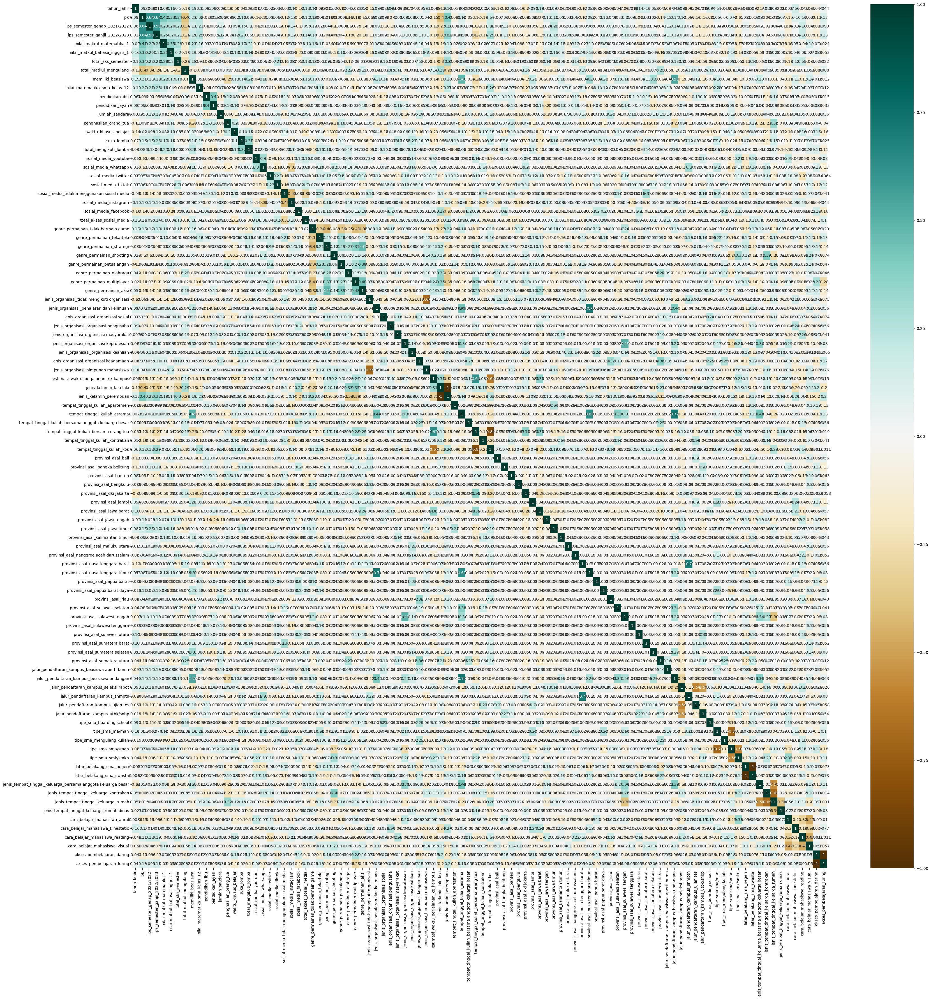

In [194]:
fig, ax = plt.subplots(figsize=[40, 40])
sns.heatmap(corr_matrix, cmap='BrBG', annot=True, ax=ax)

plt.show()

### Numeric ~ Numeric

In [195]:
corr_matrix_numeric = df_outlier_treatment[list_numeric_data].corr()
corr_matrix_numeric

,ipk,ips_semester_genap_2021/2022,ips_semester_ganjil_2022/2023,total_sks_semester,total_matkul_mengulang,nilai_matematika_sma_kelas_12
ipk,1.000000,0.765443,0.753870,0.508974,-0.481521,0.283384
ips_semester_genap_2021/2022,0.765443,1.000000,0.746577,0.355794,-0.416644,0.234660
ips_semester_ganjil_2022/2023,0.753870,0.746577,1.000000,0.357971,-0.319746,0.320366
total_sks_semester,0.508974,0.355794,0.357971,1.000000,-0.364645,-0.048749
total_matkul_mengulang,-0.481521,-0.416644,-0.319746,-0.364645,1.000000,-0.099715
nilai_matematika_sma_kelas_12,0.283384,0.234660,0.320366,-0.048749,-0.099715,1.000000


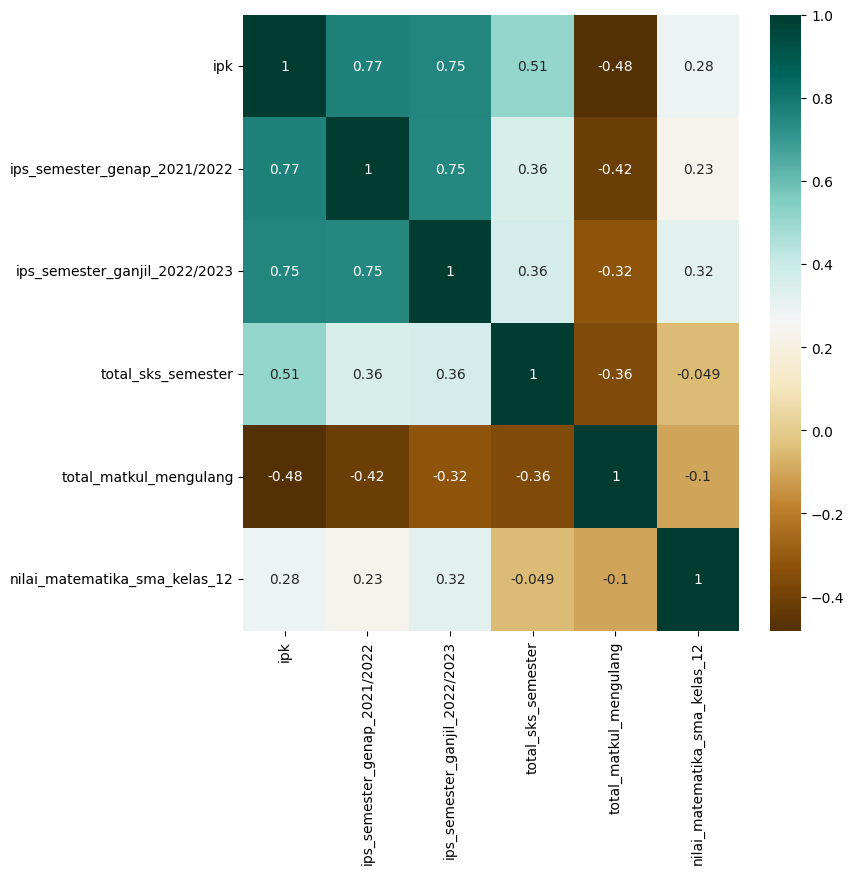

In [196]:
fig, ax = plt.subplots(figsize=[8, 8])
sns.heatmap(corr_matrix_numeric, cmap='BrBG', ax=ax, annot=True)

plt.show()

### High Correlation to GPA (IPK)

In [197]:
corr_ipk = corr_matrix[['ipk']].drop('ipk')

In [198]:
corr_ipk.sort_values(by='ipk', ascending=False)[:15]

,ipk
ips_semester_ganjil_2022/2023,0.641071
ips_semester_genap_2021/2022,0.638057
nilai_matkul_matematika_1,0.410190
jenis_kelamin_perempuan,0.398673
total_sks_semester,0.336630
nilai_matkul_bahasa_inggris_1,0.333056
nilai_matematika_sma_kelas_12,0.220464
memiliki_beasiswa,0.208141
genre_permainan_tidak bermain game,0.184138
tempat_tinggal_kuliah_kos,0.165717


In [199]:
corr_ipk.sort_values(by='ipk', ascending=False)[-15:]

,ipk
jalur_pendaftaran_kampus_ujian tes,-0.121499
akses_pembelajaran_daring,-0.126303
sosial_media_youtube,-0.131360
provinsi_asal_sumatera utara,-0.140487
sosial_media_facebook,-0.144846
genre_permainan_aksi,-0.145490
tipe_sma_smk/smkn,-0.150226
estimasi_waktu_perjalanan_ke_kampus,-0.151761
jalur_pendaftaran_kampus_utbk/snbp,-0.154272
cara_belajar_mahasiswa_aural,-0.154665


In [200]:
df_outlier_treatment['ipk'].value_counts().sort_index()

ipk
2.305    2
2.380    1
2.400    1
2.440    1
2.570    1
        ..
3.880    1
3.890    1
3.930    1
3.940    1
3.970    1
Name: count, Length: 83, dtype: int64

In [201]:
df_outlier_treatment[['ipk', 'nilai_matkul_matematika_1']]

,ipk,nilai_matkul_matematika_1
0,3.01,3
1,3.25,3
2,3.29,6
3,3.33,3
4,3.32,1
...,...,...
134,3.34,0
135,2.64,1
136,2.57,0
137,3.08,1


In [202]:
df_outlier_treatment['nilai_matkul_matematika_1'].value_counts().sort_index()

nilai_matkul_matematika_1
0    17
1    19
2    11
3    21
4    10
5    11
6    50
Name: count, dtype: int64

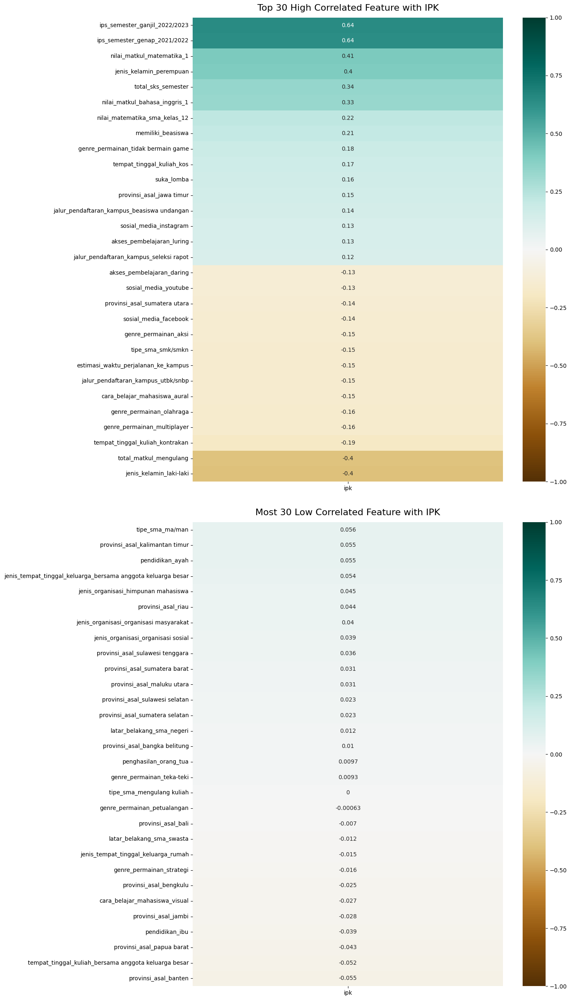

In [203]:
high_ipk_corr_feature = abs(corr_ipk).sort_values(by='ipk', ascending=False)[:30].index
low_ipk_corr_feature = abs(corr_ipk).sort_values(by='ipk', ascending=False)[-30:].index

fig, axs = plt.subplots(2, 1, figsize=[10, 24])
plt.tight_layout(pad=0.4, w_pad=0.8, h_pad=5.0)

plots_title =[
    'Top 30 High Correlated Feature with IPK',
    'Most 30 Low Correlated Feature with IPK'
]
for (ax, data, title) in zip(axs.flatten(), [high_ipk_corr_feature, low_ipk_corr_feature], plots_title):
    sns.heatmap(corr_ipk.loc[data].sort_values(by='ipk', ascending=False),
                vmin=-1, vmax=1, annot=True, cmap='BrBG', ax=ax)

    ax.set_title(title, fontdict={'fontsize':16}, pad=12)
    
savefig('correlated_feature_with_IPK')
plt.show()

# Data Scaling

Pada tahap ini, dilakukan data scaling pada masing-masing kolom menggunakan metode modifikasi dari log transform, yaitu metode yeo-jhonson. Untuk detail lengkap metodenya dapat dilihat pada artikel berikut: <br>
https://feature-engine.trainindata.com/en/latest/user_guide/transformation/YeoJohnsonTransformer.html

## Apply PowerTransformer for Numeric Data

In [204]:
columns_numeric_data = df_outlier_treatment[list_numeric_data].copy()
columns_numeric_data.head()

,ipk,ips_semester_genap_2021/2022,ips_semester_ganjil_2022/2023,total_sks_semester,total_matkul_mengulang,nilai_matematika_sma_kelas_12
0,3.01,2.95,3.10,22.0,1.0,78.75
1,3.25,3.19,3.31,22.0,0.0,89.00
2,3.29,3.33,3.08,22.0,0.0,89.00
3,3.33,3.56,3.46,22.0,1.0,82.00
4,3.32,3.41,3.34,22.0,0.0,89.00


In [205]:
# scaler = MinMaxScaler()
scaler = PowerTransformer(method='yeo-johnson', standardize=True)

columns_numeric_data[list_numeric_data] = scaler.fit_transform(columns_numeric_data[list_numeric_data])
columns_numeric_data.head()

,ipk,ips_semester_genap_2021/2022,ips_semester_ganjil_2022/2023,total_sks_semester,total_matkul_mengulang,nilai_matematika_sma_kelas_12
0,0.423423,0.188867,0.394958,0.625,0.166667,0.000000
1,0.567568,0.379722,0.536134,0.625,0.000000,0.569444
2,0.591592,0.491054,0.381512,0.625,0.000000,0.569444
3,0.615616,0.673956,0.636975,0.625,0.166667,0.180556
4,0.609610,0.554672,0.556302,0.625,0.000000,0.569444


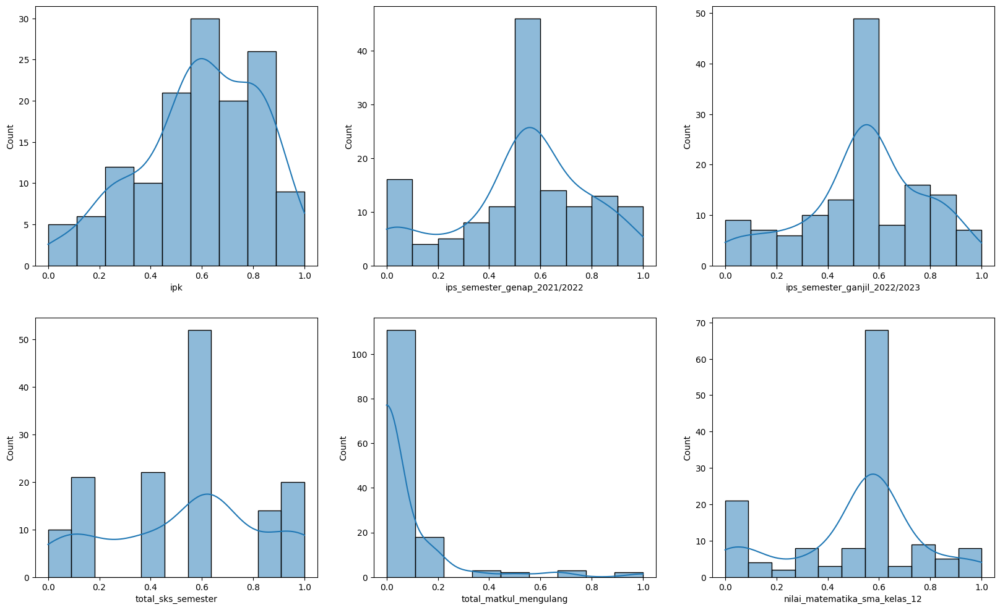

In [206]:
fig, axs = plt.subplots(2, 3, figsize=[20, 12])
for index, data in enumerate(columns_numeric_data.columns):
    sns.histplot(data=columns_numeric_data[data].astype(float), kde=True, ax=axs[index//3, index%3])

In [141]:
df_outlier_treatment[list_numeric_data] = columns_numeric_data

## Apply PowerTransformer for Ordinal Data

In [142]:
columns_ordinal_scaled = df_outlier_treatment[list_ordinal_data].copy()
columns_ordinal_scaled.head()

,tahun_lahir,nilai_matkul_matematika_1,nilai_matkul_bahasa_inggris_1,memiliki_beasiswa,pendidikan_ibu,pendidikan_ayah,jumlah_saudara,penghasilan_orang_tua,waktu_khusus_belajar,suka_lomba,total_mengikuti_lomba,total_akses_sosial_media,estimasi_waktu_perjalanan_ke_kampus
0,2,3,6,0,3,3,1,4,1,3.0,2,3,0
1,2,3,4,0,3,3,1,1,1,1.0,0,3,1
2,3,6,6,0,6,6,1,2,1,1.0,0,2,3
3,3,3,7,0,6,7,2,3,1,1.0,0,4,2
4,3,1,3,0,4,3,2,2,1,1.0,0,2,0


In [143]:
# scaler = MinMaxScaler()
scaler = PowerTransformer(method='yeo-johnson', standardize=True)

columns_ordinal_scaled[list_ordinal_data] = scaler.fit_transform(columns_ordinal_scaled[list_ordinal_data])
columns_ordinal_scaled.head()

,tahun_lahir,nilai_matkul_matematika_1,nilai_matkul_bahasa_inggris_1,memiliki_beasiswa,pendidikan_ibu,pendidikan_ayah,jumlah_saudara,penghasilan_orang_tua,waktu_khusus_belajar,suka_lomba,total_mengikuti_lomba,total_akses_sosial_media,estimasi_waktu_perjalanan_ke_kampus
0,-1.524608,-0.241454,0.373689,-0.397911,-0.570029,-0.735606,-0.718496,2.058586,0.569043,0.936469,1.569643,0.042958,-1.126548
1,-1.524608,-0.241454,-0.982475,-0.397911,-0.570029,-0.735606,-0.718496,-1.067276,0.569043,-1.432662,-1.045554,0.042958,0.157930
2,-0.173425,1.067380,0.373689,-0.397911,1.332400,0.953294,-0.718496,-0.162199,0.569043,-1.432662,-1.045554,-0.885065,1.282721
3,-0.173425,-0.241454,1.217077,-0.397911,1.332400,1.499122,0.170540,0.887095,0.569043,-1.432662,-1.045554,1.049192,0.833942
4,-0.173425,-1.153925,-1.494403,-0.397911,0.106819,-0.735606,0.170540,-0.162199,0.569043,-1.432662,-1.045554,-0.885065,-1.126548


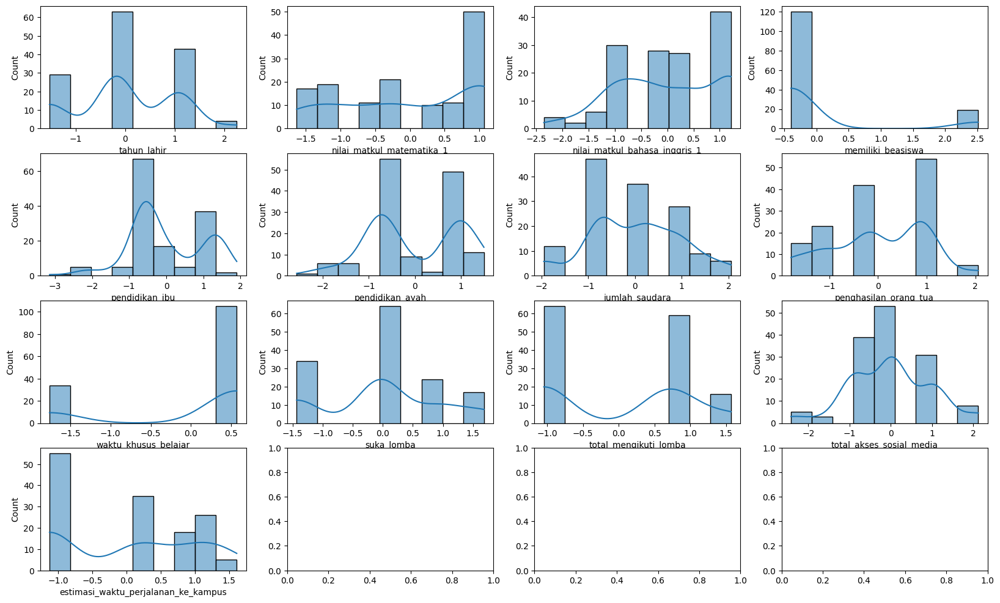

In [144]:
fig, axs = plt.subplots(4, 4, figsize=[20, 12])
for index, data in enumerate(columns_ordinal_scaled.columns):
    sns.histplot(data=columns_ordinal_scaled[data].astype(float), kde=True, ax=axs[index//4, index%4])

In [145]:
df_outlier_treatment[list_ordinal_data] = columns_ordinal_scaled

# Dimensional Reduction

Dilakukan metode dimensional reduction untuk menurunkan dimensi atau jumlah fitur yang besar dari suatu dataset. Pada program ini, fitur yang dihasilkan dari pengolahan dataset ini sebesar 98 kolom. <br>

adapun metode dimensional reduction yang dapat digunakan yaitu seperti Principal Component Analysis. Untuk penjelasan detail mengenai penerapan PCA, dapat dilihat pada tautan di artikel berikut:

https://towardsdatascience.com/principal-component-analysis-ac90b73f68f5 <br>
https://towardsdatascience.com/a-step-by-step-implementation-of-principal-component-analysis-5520cc6cd598 <br>
https://www.mikulskibartosz.name/pca-how-to-choose-the-number-of-components/ <br>

## PCA (Principal Component Analysis)

In [146]:
df_outlier_treatment

,tahun_lahir,ipk,ips_semester_genap_2021/2022,ips_semester_ganjil_2022/2023,nilai_matkul_matematika_1,nilai_matkul_bahasa_inggris_1,total_sks_semester,total_matkul_mengulang,memiliki_beasiswa,nilai_matematika_sma_kelas_12,...,jenis_tempat_tinggal_keluarga_bersama anggota keluarga besar,jenis_tempat_tinggal_keluarga_kontrakan,jenis_tempat_tinggal_keluarga_rumah,jenis_tempat_tinggal_keluarga_rumah dinas,cara_belajar_mahasiswa_aural,cara_belajar_mahasiswa_kinestetic,cara_belajar_mahasiswa_reading,cara_belajar_mahasiswa_visual,akses_pembelajaran_daring,akses_pembelajaran_luring
0,-1.524608,-0.811601,-1.288372,-0.684552,-0.241454,0.373689,0.216663,1.956294,-0.397911,-1.783712,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
1,-1.524608,-0.224720,-0.670409,-0.108950,-0.241454,-0.982475,0.216663,-0.502139,-0.397911,0.168587,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
2,-0.173425,-0.118692,-0.262257,-0.736376,1.067380,0.373689,0.216663,-0.502139,-0.397911,0.168587,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
3,-0.173425,-0.010230,0.491118,0.338446,-0.241454,1.217077,0.216663,1.956294,-0.397911,-1.248480,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
4,-0.173425,-0.037575,-0.012235,-0.021934,-1.153925,-1.494403,0.216663,-0.502139,-0.397911,0.168587,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
134,-1.524608,0.017270,1.684472,1.506455,-1.633825,-0.982475,-1.669796,-0.502139,-0.397911,0.168587,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
135,1.073615,-1.562939,-1.806816,-1.475968,-1.153925,0.373689,-1.324012,1.956294,-0.397911,-1.420842,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
136,-1.524608,-1.685841,-1.806816,-2.003897,-1.633825,-1.494403,0.216663,1.956294,-0.397911,0.168587,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
137,1.073615,-0.648948,-0.913858,-0.963306,-1.153925,-0.359624,0.216663,-0.502139,-0.397911,0.647546,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0


In [147]:
df_outlier_treatment.describe().T

,count,mean,std,min,25%,50%,75%,max
tahun_lahir,139.0,-2.492011e-16,1.003617,-1.524608,-0.173425,-0.173425,1.073615,2.243486
ipk,139.0,2.172523e-16,1.003617,-2.100581,-0.637048,-0.037575,0.803964,2.083084
ips_semester_genap_2021/2022,139.0,2.683705e-16,1.003617,-1.806816,-0.514402,-0.012235,0.633335,2.116571
ips_semester_ganjil_2022/2023,139.0,6.389773e-16,1.003617,-2.003897,-0.552677,-0.021934,0.702694,2.217036
nilai_matkul_matematika_1,139.0,-2.555909e-17,1.003617,-1.633825,-1.153925,0.200890,1.067380,1.067380
...,...,...,...,...,...,...,...,...
cara_belajar_mahasiswa_kinestetic,139.0,1.079137e-01,0.311393,0.000000,0.000000,0.000000,0.000000,1.000000
cara_belajar_mahasiswa_reading,139.0,2.374101e-01,0.427034,0.000000,0.000000,0.000000,0.000000,1.000000
cara_belajar_mahasiswa_visual,139.0,4.100719e-01,0.493625,0.000000,0.000000,0.000000,1.000000,1.000000
akses_pembelajaran_daring,139.0,3.021583e-01,0.460854,0.000000,0.000000,0.000000,1.000000,1.000000


### Menentukan Jumlah Komponen yang Akan Dibentuk Dari Penerapan PCA, Berdasarkan Persentase Explained Variance

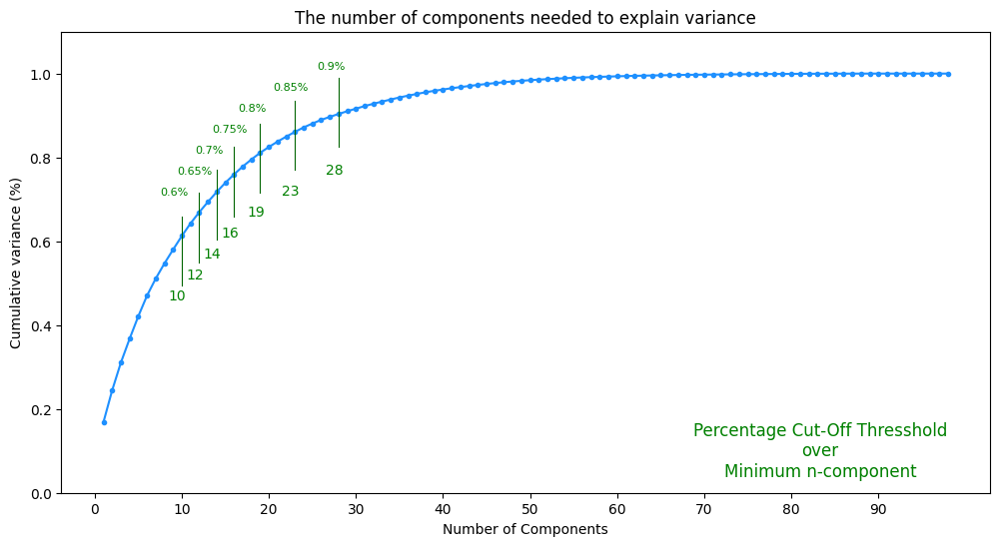

In [148]:
pca = PCA()
pca.fit(df_outlier_treatment)

number_components = np.arange(1, pca.n_components_ + 1, step=1)
cumulative_explained_variance = np.cumsum(pca.explained_variance_ratio_)
cum_var_threshold_list = np.flip(np.round(np.arange(0.6, 0.9, 0.05), 2))

fig, ax = plt.subplots(figsize=[12, 6])

plt.plot(number_components, cumulative_explained_variance, marker='.', linestyle='-', color='dodgerblue')

# plt.axhline(y=cum_var_threshold, color='r', linestyle='-')
for cum_var_threshold in cum_var_threshold_list:
    cum_var_above_threshold = [x+1 for x in range(len(cumulative_explained_variance)) if cumulative_explained_variance[x] >= cum_var_threshold]
    
    plt.axvline(x=cum_var_above_threshold[0], ymin=cum_var_threshold-0.15, ymax=cum_var_threshold,
                color='darkgreen', linestyle='-', linewidth=0.8)
    plt.text(cum_var_above_threshold[0]-1.5, cum_var_threshold-0.14, f'{cum_var_above_threshold[0]}', color = 'g', fontsize=10)
    plt.text(cum_var_above_threshold[0]-2.5, cum_var_threshold+0.11, f'{cum_var_threshold}%', color = 'g', fontsize=8)
plt.text(pca.n_components_*0.85, 0.1, f'Percentage Cut-Off Thresshold\nover\nMinimum n-component',
         horizontalalignment='center', verticalalignment='center', color = 'g', fontsize=12)

plt.xlabel('Number of Components')
plt.xticks(np.arange(0, pca.n_components_ + 1, step=10)) #change from 0-based array index to 1-based human-readable label
plt.ylabel('Cumulative variance (%)')
plt.ylim(0.0,1.1)
plt.title('The number of components needed to explain variance')

savefig('analysis_of_number_of_components_PCA_outlier_needed')
plt.show()

### Penerapan PCA dengan Jumlah Komponen yang Telah Ditentukan Kedalam Dataset yang Dimiliki

In [149]:
### Pembentukan dataset baru dengan jumlah fitur atau kolom yang lebih sedikit (19 kolom) 
### dibandingkan dataset fitur semula (89 kolom) menggunakan metode PCA ini dapat dijabarkan sebagai berikut:
### Memprojeksikan 89 kolom data kedalam dimensi data yang lebih rendah yaitu 19 kolom data,
### dengan menerapkan nilai eigen vector yang diperoleh pada data semula dari 19 nilai eigen value terbesar,\
### lalu dilakukan dot product kepada data awal

n_components = 19

pca = PCA(n_components=n_components)
dataset_pca = pca.fit_transform(df_outlier_treatment)

df_pca_outlier_treated = pd.DataFrame(dataset_pca,
                                      columns=[f'PC{x+1}' for x in range(n_components)])
df_pca_outlier_treated

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19
0,1.802894,-0.987998,2.643094,1.842919,-0.972748,-1.090438,-2.375681,0.378085,-0.139148,0.056194,-0.446964,-0.639467,0.027574,-0.069716,0.006755,0.379956,0.303871,0.896158,-0.833976
1,1.034113,0.574502,-0.074227,-1.108725,-0.518584,-1.794490,1.070784,-0.468657,0.366720,-0.802308,-0.880928,0.616052,0.543570,0.280447,-0.516950,1.106705,0.351004,-0.311859,-0.152648
2,0.953768,-1.669826,-1.153220,1.402366,0.361635,0.039076,1.788102,-0.501662,-0.251744,-0.468878,-1.048272,0.929218,0.286884,0.796428,-0.301361,0.911326,0.670705,0.105234,0.290104
3,0.875784,-1.678915,-2.111825,1.653553,-0.395017,0.362637,-1.096472,-1.738698,0.151666,-0.818600,0.283170,-1.382514,-0.159871,0.247079,-0.995713,0.645939,0.100422,-0.390193,-0.664898
4,0.824546,-0.177371,-0.355137,-1.983383,-0.541855,-1.467023,0.232592,-0.454347,-0.629288,0.336627,0.004721,0.602788,-0.634478,-0.046715,-1.300004,-1.033594,0.529706,-0.307847,1.479822
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
134,0.202643,-0.023615,1.626408,-0.713979,-1.955501,1.182416,0.905031,0.947575,2.731249,0.975910,-1.029801,-0.572250,-1.290549,0.436222,-1.208927,-1.397365,-1.010126,2.316899,0.269071
135,4.055205,1.097391,-1.016089,1.318074,1.247497,0.497462,-0.707674,0.886580,-0.248191,-0.059838,0.550724,-1.768246,0.485613,-0.941812,0.090485,-0.347677,-0.061207,0.026386,0.964905
136,4.401123,2.377851,0.640817,-0.345308,0.395096,-0.593423,0.575186,-0.791049,-0.833866,-0.859576,-1.710912,-0.322626,-0.642745,-1.053996,-0.498518,0.024546,-0.301840,-0.535700,-0.786263
137,0.598597,0.310929,-0.858786,-1.474495,1.866858,1.237979,-0.585590,0.781545,-0.083920,1.725072,-1.065890,0.424214,-0.588083,-0.662692,-0.532224,-0.362420,-0.583020,-0.777785,-1.219508


### Menjabarkan Karakteristik Setiap Komponen yang Dibentuk Pada Dataset Yang Diterapkan PCA

Reference: <br>
https://medium.com/swlh/interpreting-principal-components-fifa20-players-use-case-639fde373bac <br>
https://online.stat.psu.edu/stat505/lesson/11/11.4 <br>
https://support.minitab.com/en-us/minitab/21/help-and-how-to/statistical-modeling/multivariate/how-to/principal-components/interpret-the-results/key-results/

In [150]:
### mengambil nilai eigenvector yang diperoleh pada proses PCA, yang menjelaskan keterkaitan masing-masing komponen
### terhadap nilai fitur semula

df_pca_outlier_eigvec = pd.DataFrame(pca.components_.T,
                                     index=df_outlier_treatment.columns,
                                     columns=[f'PC{x+1}' for x in range(n_components)])
df_pca_outlier_eigvec

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19
tahun_lahir,-0.099120,0.050276,-0.295190,0.020707,0.482313,0.169042,0.052436,0.265091,-0.259482,0.148361,0.418249,-0.113727,-0.309587,0.053519,0.098611,-0.017729,0.247198,0.082912,0.108176
ipk,-0.426974,-0.020017,-0.142258,0.079431,-0.108536,-0.006185,0.106204,-0.010891,0.091150,-0.087429,-0.083231,-0.059946,-0.045052,-0.080552,0.054485,-0.074505,0.003407,0.020477,-0.007338
ips_semester_genap_2021/2022,-0.379123,0.018416,-0.099923,0.017190,-0.219604,-0.005093,0.172380,-0.078712,0.151467,-0.014544,0.001121,-0.180771,-0.184764,0.125010,-0.233815,0.002763,-0.037080,0.068750,0.164609
ips_semester_ganjil_2022/2023,-0.386100,0.043517,-0.033958,-0.106512,-0.208507,0.066479,0.020413,-0.196883,0.174201,-0.116077,0.106409,-0.184403,-0.083706,-0.063635,-0.144644,-0.072554,0.066272,0.115086,0.102948
nilai_matkul_matematika_1,-0.299710,-0.065011,0.059086,0.184768,0.071604,0.135813,-0.083378,0.034282,-0.219776,-0.279162,-0.407224,0.102259,0.052754,0.319134,0.354748,0.217730,0.135045,-0.170282,0.220283
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cara_belajar_mahasiswa_kinestetic,-0.019558,-0.001193,-0.023603,-0.006443,0.028079,0.008908,-0.014498,0.010446,-0.030569,0.002931,0.016399,0.037861,-0.012183,-0.037316,0.046915,-0.077627,0.019235,0.043719,-0.160899
cara_belajar_mahasiswa_reading,-0.033443,-0.019273,-0.011958,-0.045929,-0.062551,-0.072834,-0.040869,-0.040694,-0.053232,0.030050,0.068464,-0.011821,-0.136250,-0.052814,-0.124390,0.168932,-0.115621,0.107531,0.033336
cara_belajar_mahasiswa_visual,0.003880,0.007474,0.070910,0.062178,0.041770,0.077049,0.057017,-0.035958,0.024442,-0.065161,-0.115775,0.029713,0.131777,0.028466,0.045508,-0.013088,0.197644,-0.039191,0.037527
akses_pembelajaran_daring,0.016486,-0.040733,0.069447,0.062029,0.009654,-0.014891,0.049161,0.012826,-0.021079,0.131615,0.019965,0.186238,0.074158,0.182565,-0.064164,0.175256,-0.003931,0.289145,0.045346


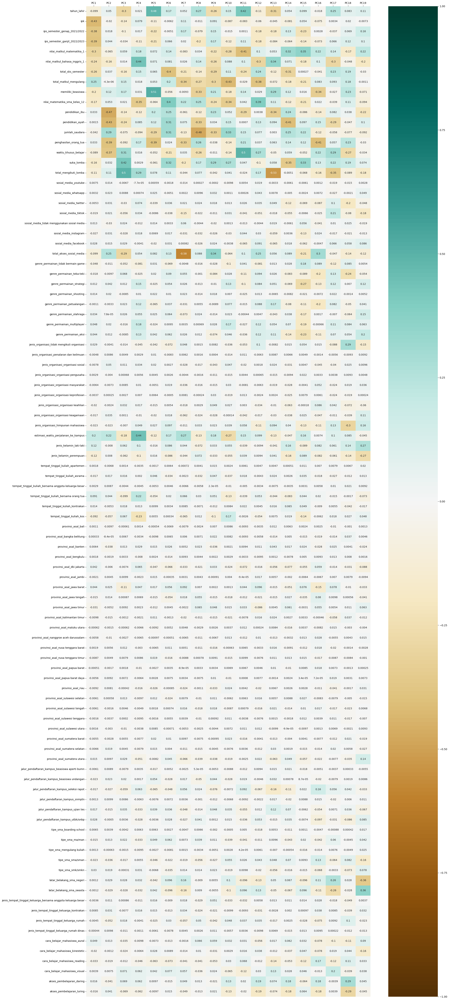

In [151]:
### bentuk visualisasi dari nilai eigenvector pada PCA secara keseluruhan

plt.figure(figsize=[25, 70])

sns.heatmap(df_pca_outlier_eigvec, vmin=-1, vmax=1, annot=True, cmap='BrBG')

plt.tick_params(axis='x',
                top=True, labeltop=True,
                bottom=False, labelbottom=False)

savefig('eigen_vector_matrix_for_interpretate_components_to_features')
plt.show()

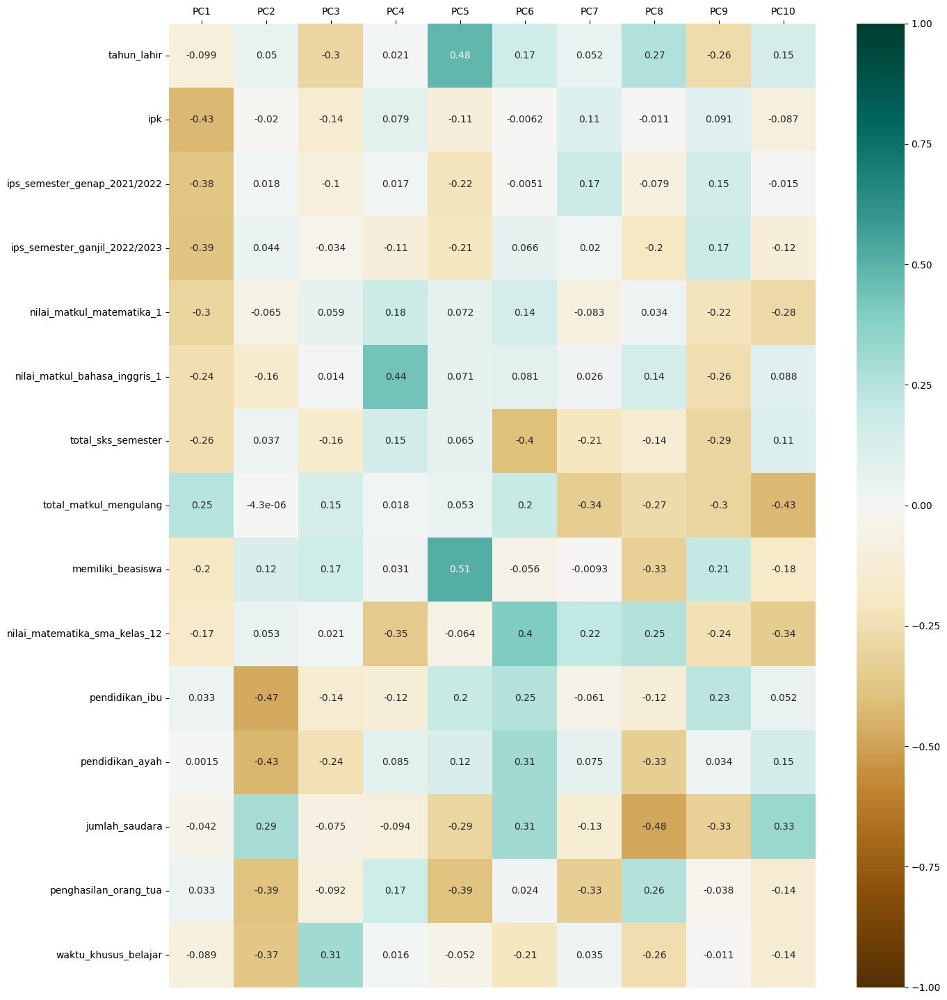

In [152]:
### bentuk visualisasi dari nilai eigenvector pada PCA dalam bentuk beberapa sampel

plt.figure(figsize=[15, 18])

sns.heatmap(df_pca_outlier_eigvec.loc['tahun_lahir':'waktu_khusus_belajar', 'PC1':'PC10'], vmin=-1, vmax=1, annot=True, cmap='BrBG')

plt.tick_params(axis='x',
                top=True, labeltop=True,
                bottom=False, labelbottom=False)

savefig('eigen_vector_matrix_for_interpretate_components_to_features_sample')
plt.show()

#### Proses Penamaan masing-masing Komponen pada data baru yang telah dilakukan proses PCA

In [153]:
### mengambil nilai keterkaitan pada fitur semula terhadap masing-masing component yang
### memiliki nilai lebih besar dari thresshold yang ditentukan

threshold = 0.25

for column in df_pca_outlier_eigvec:
    print(f'feature having more than {int(threshold*100)}% contribution into {column}:')
    print('-'*10)
    feature_corr_list = abs(df_pca_outlier_eigvec.loc[abs(df_pca_outlier_eigvec[column]) > threshold, column]).sort_values(ascending=False).index.tolist()
    for item in feature_corr_list:
        print(f'{item} :\t\t{df_pca_outlier_eigvec.loc[item, column]*100:.2f}%')
    
    print('='*100)

feature having more than 25% contribution into PC1:
----------
ipk :		-42.70%
ips_semester_ganjil_2022/2023 :		-38.61%
ips_semester_genap_2021/2022 :		-37.91%
nilai_matkul_matematika_1 :		-29.97%
total_sks_semester :		-25.61%
feature having more than 25% contribution into PC2:
----------
pendidikan_ibu :		-47.03%
pendidikan_ayah :		-42.99%
penghasilan_orang_tua :		-39.27%
waktu_khusus_belajar :		-37.31%
jumlah_saudara :		29.48%
feature having more than 25% contribution into PC3:
----------
total_mengikuti_lomba :		49.54%
suka_lomba :		41.66%
waktu_khusus_belajar :		31.08%
tahun_lahir :		-29.52%
total_akses_sosial_media :		-28.98%
feature having more than 25% contribution into PC4:
----------
estimasi_waktu_perjalanan_ke_kampus :		44.40%
nilai_matkul_bahasa_inggris_1 :		43.66%
nilai_matematika_sma_kelas_12 :		-35.20%
total_mengikuti_lomba :		29.12%
feature having more than 25% contribution into PC5:
----------
memiliki_beasiswa :		51.26%
tahun_lahir :		48.23%
penghasilan_orang_tua :		-3

In [155]:
### proses penamaan masing-masing component dapat ditentukan dengan 2 cara:
### - mengambil nilai fitur keterkaitan yang paling besar sebagai representasi tunggal dari komponen tersebut
### - mengambil beberapa nilai fitur keterkaitan yang melebihi batas thresshold yang ditentukan untuk mempresentasikan fitur
###   dari komponen tersebut

principal_component_feature = {
    'PC1':'nilai_ipk_ips_sks_semester_minat_lomba_tinggi', #fixed
    'PC2':'perjalanan_kampus_lama', #fixed
    'PC3':'pendidikan_ortu_rendah',  
    'PC4':'nilai_matkul_bahasa_inggris_matematika_rendah', #fixed
    'PC5':'sering_akses_sosial_media_sedikit_waktu_belajar', #fixed
    'PC6':'penghasilan_ortu_rendah_memiliki_beasiswa',
    'PC7':'jumlah_saudara_banyak', #fixed
    'PC8':'total_matkul_mengulang_banyak', #fixed
    'PC9':'meluangkan_waktu_belajar', #fixed
    'PC10':'matkul_semester_1_matematika_tinggi_binggris_rendah', 
    'PC11':'sedikit_bermain_game_pendidikan_ayah_tinggi', #fixed
    'PC12':'preferensi_belajar_luring_genre_permainan_teka-teki_petualangan', #fixed
    'PC13':'penghasilan_orang_tua_tinggi',
    'PC14':'latar_belakang_sma_swasta',  #fixed
    'PC15':'latar_belakang_sma_negeri',
    'PC16':'pendidikan_ibu_tinggi',
    'PC17':'jalur_pendaftaran_kampus_seleksi_rapot_organuisasi_himpunan_mahasiswa', #fixed
    'PC18':'sosial_media_twitter_tiktok_gaya_belajar_visual', #fixed
    'PC19':'gaya_belajar_aural_preferensi_belajar_daring', #fixed
}

In [156]:
df_pca_outlier_treated = df_pca_outlier_treated.rename(columns=principal_component_feature)

In [157]:
df_pca_outlier_eigvec.to_excel('./data/dataset_outlier_pca_eigenvector_explaination.xlsx')

# Convert Dataset For Modeling Purpose

In [170]:
df_transformed.to_csv('./data/dataset_train_preprocess_only.csv', index=False)
df_outlier_treatment.to_csv('./data/dataset_train_preprocess_and_outlier_treatment.csv', index=False)
df_pca_outlier_treated.to_csv('./data/dataset_train_pca_outlier_treated.csv', index=False)